<a href="https://colab.research.google.com/github/kevinroccapriore/AE-DKL/blob/main/AE_STEM_DKL_BO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DKL-GPR-BO for active learning
This notebook demonstrates how to use a deep kernel learning (DKL)-based Gaussian process regression (GPR) with vector output for autonomous experiments. Here we will be using the pre-acquired experimental dataset on plasmonic nanoparticles (HAADF + EELS) from `Kevin M. Roccapriore`.

*Prepared by `Maxim Ziatdinov` (June 2021)*

* Project conceived and overseen by `Sergei Kalinin` (<font color = 'crimson'>ORNL</font>)
* Electron microscopy, data preparation, and autonomous experiment carried out by `Kevin M. Roccapriore` (<font color = 'crimson'>ORNL</font>)
* DKL codes prepared and compiled by `Maxim Ziatdinov` (<font color = 'crimson'>ORNL</font>)


We graciously thank our friends and collaborators for providing the excellent samples used in this work:
* Plasmonic nanoparticles were chemically synthesized by `Shin-Hum Cho` (<font color = 'crimson'>Samsung Electronics</font>) & `Delia J. Milliron` (<font color = 'crimson'>UT Austin</font>)
* MnPS3 crystals were grown by `Nan Huang` & `David G. Mandrus` (<font color = 'crimson'>UT Knoxville</font>)

## Installations/Imports/Downloads

Installation:

In [1]:
!pip install -q --upgrade torch==1.8.1 torchvision==0.9.1 torchtext==0.9.1
!pip install -q --upgrade git+https://github.com/pycroscopy/atomai 

     |████████████████████████████████| 804.1 MB 2.7 kB/s 
     |████████████████████████████████| 17.4 MB 184 kB/s 
     |████████████████████████████████| 7.1 MB 31.6 MB/s 
     |████████████████████████████████| 193 kB 7.8 MB/s 
     |████████████████████████████████| 498 kB 63.7 MB/s 
     |████████████████████████████████| 865 kB 48.9 MB/s 


Check the GPU type/status:

In [2]:
!nvidia-smi

Fri Aug  6 16:07:24 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
#@title Library imports
import numpy as np
import matplotlib.pyplot as plt
import glob
import json
from scipy import ndimage, signal, interpolate
import operator
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches

import torch
import atomai as aoi
from sklearn.model_selection import train_test_split

from copy import deepcopy
from numpy.random import RandomState

from skimage import draw
from skimage.transform import resize
from skimage import color
from skimage.draw import circle


# from IPython.display import Video
from IPython.core.display import Video
!pip install imageio-ffmpeg
import imageio

# To stop warning logs during movie creation
import imageio.core.util

     |████████████████████████████████| 26.9 MB 1.2 MB/s 


In [4]:
#@title Acquisition function definitions
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: Union[float, torch.Tensor] = 0.01
       ) -> np.ndarray:
    """
    Expected Improvement
    """
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a  
    device=model.device
    dtype = model.dtype
    X, best_f, xi = tor(X), tor(best_f), tor(xi)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, sigma = posterior.mean, posterior.variance.sqrt()
    u = (mean - best_f.expand_as(mean) - xi.expand_as(mean)) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()


def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: Union[float, torch.Tensor] = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    tt = torch.tensor
    tor = lambda a: tt(a) if isinstance(a, (np.ndarray, float)) else a  
    device = model.device
    dtype = model.dtype
    X, beta = tor(X), tor(beta)
    posterior = model._compute_posterior(X.to(dtype).to(device))
    mean, var = posterior.mean, posterior.variance
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()


def CE(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor]) -> np.ndarray:
    """Uncertainty-based exploration"""
    device = model.device
    dtype = model.dtype
    X = torch.tensor(X) if isinstance(X, (np.ndarray, float)) else X
    posterior = model._compute_posterior(X.to(dtype).to(device))
    obj = posterior.variance
    return obj.detach().cpu().numpy()


In [5]:
#@title Other functions
def plot_DKL_prediction_preacquired_notactive(model_name, structural_img, spectral_img, figsize = (15,8), energy_range = [0,-1]):

  mean,var = model_name.predict(X, batch_size = len(X))
  mean, var = mean.T, var.T
  s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  s3 = y.shape[0]

  dkl_prediction = np.full((s1*s2,s3), np.nan)
  dkl_uncertainty = np.full((s1*s2,s3), np.nan)
  measurement_og = np.full((s1*s2,s3), np.nan)

  for ii in range(indices[:,0].shape[0]):
    dkl_prediction[ii] = mean[ii, :]
    dkl_uncertainty[ii] = var[ii, :]
    measurement_og[ii] = y.T[ii, :]

  dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
  dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))
  measurement_og = measurement_og.reshape((s1,s2,s3))

  plt.figure(figsize=figsize)
  gs = gridspec.GridSpec(2,2)
  ax1,ax2 = plt.subplot(gs[0,0]), plt.subplot(gs[0,1])
  ax3,ax4 = plt.subplot(gs[1,0]), plt.subplot(gs[1,1])

  k1,k2 = energy_range[0], energy_range[1]

  im1 = ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
  im2 = ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')
  ax1.set_title('DKL prediction', fontsize = 15)
  ax2.set_title('DKL uncertainty', fontsize = 15)

  cbar1 = plt.colorbar(im1, ax=ax1)
  cbar1.ax.tick_params(labelsize = 15)
  cbar2 = plt.colorbar(im2, ax=ax2)
  cbar2.ax.tick_params(labelsize = 15)

  predicted_spectrum = np.mean(mean[:,k1:k2], axis = 0)
  measured_spectrum = np.mean(y.T[:,k1:k2], axis = 0)

  ax3.plot(e_reduced[k1:k2],measured_spectrum, linewidth=6, c = 'blue', label="ground truth", zorder=0)
  ax3.plot(e_reduced[k1:k2],predicted_spectrum, linewidth=4, c='crimson', label="prediction", zorder=1)

  ax4.imshow(np.mean(measurement_og[:,:,k1:k2], axis = 2), origin = 'lower')

  leg=ax3.legend(fontsize = 20)
  for line in leg.get_lines():
    line.set_linewidth(10)

  ax3.set_xlabel('Energy loss (eV)', fontsize = 15, labelpad = 15, weight = 'bold')
  ax3.set_ylabel('Intensity (a.u.)', fontsize = 15, weight = 'bold')
  ax3.tick_params(labelsize = 15, length = 8, width = 3)
  ax3.axhline(0, c='k')

  all_axes = [ax1,ax2,ax3,ax4]
  for ax in all_axes:
    for axis in ['top','bottom','left','right']:
      ax.spines[axis].set_linewidth(3)
  
  ax1.axis('off'), ax2.axis('off'), ax4.axis('off')

  return dkl_prediction, dkl_uncertainty, predicted_spectrum, measured_spectrum, mean, var

def Make_AF_movies_preacquired(acquisition_functions,
                               RGB = [2,1,8],
                               brightness = 0.75,
                               measured_points_in_AF = [0,0,0],
                               measured_points_in_HAADF = [1,0,0]):

  R,G,B = RGB
  # k1,k2 = 0, -1  ## Energy bands to average across

  sr1, sr2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1

  AF_all_color = np.zeros((len(acquisition_functions), sr1,sr2, 3))
  AF_all = np.zeros((len(acquisition_functions), sr1,sr2))
  AF_combined_all = []
  for frame in range(len(acquisition_functions)):
    # Generate IMAGE from points

    AF_frame = np.full((sr1,sr2), np.nan)
    AF_combined = np.concatenate((acquisition_functions[frame]['frames'], acquisition_functions[frame]['colors'].reshape(-1,1)), axis = 1)
    AF_combined_all.append(AF_combined)
    for p in AF_combined:
      c1,c2,c3 = int(p[0]-window_size/2), int(p[1]-window_size/2), p[2]
      AF_frame[c1,c2] = c3
    AF_frame = normalize_nan(AF_frame)
    AF_all[frame] = AF_frame

    # Make COLOR image from grayscale image <-- for movie later
    AF_frame_c = np.array([[[s*R*brightness,s*G*brightness,s*B*brightness] for s in r] for r in AF_frame])
    nan_coords = np.argwhere(np.isnan(AF_frame_c))[::3][:,:2]

    for coord in nan_coords:
      AF_frame_c[coord[0], coord[1]] = measured_points_in_AF
    AF_all_color[frame] = np.clip(AF_frame_c, 0, 1)
    AF_all = np.asarray(AF_all)
    # AF_combined_all = np.asarray(AF_combined_all)

  return AF_all, AF_all_color, AF_combined_all

def create_point_search_mov_preacquired(structural_img, AF_combined, size = (50,50), point_radius = 1, point_color = [1,0,0], offset = 0):

  sr1, sr2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  ir1, ir2 = structural_img.shape[0], structural_img.shape[1]
  cr1, cr2 = [int((ir1 - sr1)/2), int((ir2 - sr2)/2)]
  img_crop = structural_img[cr1:int(sr1+cr1), cr2:int(sr2+cr2)]

  size = [sr1,sr2]
  # Initialize stack
  Mov = np.zeros((len(AF_combined), sr1, sr2, 3))
  
  # Get coordinates for measured points (which are NaN)
  for frame in range(len(Mov)):
    temp = np.full((size), np.nan)
    for p in AF_combined[frame]:
      c1,c2,c3 = int(p[0]-window_size/2), int(p[1]-window_size/2), p[2]
      temp[c1,c2] = c3
    nan_coords = np.argwhere(np.isnan(temp))[:,:2]

    # Convert to color, and draw the measured points on each frame
    img_c = color.gray2rgb(normalize(img_crop))
    for m in nan_coords:
      a,b = m[0] + offset, m[1] + offset
      rr,cc = circle(a,b,point_radius)
      draw.set_color(img_c, (rr,cc), point_color)
    Mov[frame] = img_c

  return Mov

def normalize_nan(image):
  normed = (image - np.nanmin(image))/(np.nanmax(image) - np.nanmin(image))
  return normed



def plot_DKL_prediction_preacquired(model_files, step, embed = 2, precision = "double", figsize = (8,5), energy_range = [0,-1], colorscale = True):

  weights = model_files[step]
  num_cycles = 40
  dklgp_trained = aoi.models.dklGPR(data_dim, embedim=embed, precision=precision)
  dklgp_trained.compile_trainer(X, y, training_cycles = num_cycles)
  state_dict = torch.load(weights)
  dklgp_trained.gp_model.load_state_dict(state_dict)

  mean,var = dklgp_trained.predict(X, batch_size = len(X))

  s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
  s3 = y.shape[0]

  dkl_prediction = np.full((s1*s2,s3), np.nan)
  dkl_uncertainty = np.full((s1*s2,s3), np.nan)

  for ii in range(indices[:,0].shape[0]):
    dkl_prediction[ii] = mean.T[ii, :]
    dkl_uncertainty[ii] = var.T[ii, :]

  dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
  dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))

  plt.figure(figsize=figsize)
  gs = gridspec.GridSpec(1,2)
  ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

  k1,k2 = energy_range[0], energy_range[1]
  im1 = ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
  im2 = ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')

  ax1.set_title('DKL prediction: spectral average')
  ax2.set_title('DKL uncertainty: spectral average')

  plt.setp([ax1,ax2], xticks=[], yticks=[])

  if colorscale:
    cbar1 = plt.colorbar(im1, ax=ax1, fraction = 0.069,  aspect = 10)
    cbar2 = plt.colorbar(im2, ax=ax2, fraction = 0.069, aspect = 10)
    cbar1.ax.tick_params(labelsize = 15)
    cbar2.ax.tick_params(labelsize = 15)

  return dkl_prediction, dkl_uncertainty, mean, var

########################################
def DisplayAverageData(figsize = (15,5), scalebar = 15):

  fig,ax = plt.subplots(1,2,figsize=figsize)

  ax[0].imshow(img, cmap = 'gray')

  scalebar = 15

  yy,xx = img.shape[0], img.shape[1]
  xfrac, yfrac = 0.02, 0.85
  p1,p2 = xfrac*xx, yfrac*yy
  length = scalebar/imscale


  ax[0].add_patch(patches.Rectangle((p1,p2), length, length/7, color = 'w', ec = 'k', lw = 1))
  length

  ax[0].set_title("HAADF", fontsize = 22, weight = 'bold');

  avg_spec = np.mean(specim,axis=(0,1))
  ax[1].plot(e_ax, avg_spec)
  # ax[1].axvline(0.2, c='r')

  ax[1].set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
  ax[1].set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
  ax[1].tick_params(labelsize = 20, length = 8, width = 3)


  for axis in ['top','bottom','left','right']:
    ax[1].spines[axis].set_linewidth(3)

  ax[1].axhline(0, c='k')

  plt.setp(ax[0],xticks=[], yticks=[])




    
def LoadADF(filename):
    ADF1    = np.load(filename)
    ADF1j = json.load(open(filename[:-3]+'json','r'))
    ADF1_scale = ADF1j['spatial_calibrations'][0]['scale']
    return ADF1, ADF1_scale

def LoadMovie(filename):
    mov    = np.load(filename)
    movj = json.load(open(filename[:-3]+'json','r'))
    mov_scale = movj['spatial_calibrations'][1]['scale']
    return mov, mov_scale

def normalize(image):
  return (image - np.min(image))/(np.ptp(image))


# Patch functions
def create_patches(image, winsize):
    grid = aoi.utils.get_coord_grid(image, step = 1)
    patches, coords, _ = aoi.utils.extract_subimages(image, grid, window_size=winsize)
    patches = patches[:,:,:,0]

    return patches

def prepare_data_testing(patches, winsize, Spectrum_image):
    # Array to store images

    p1,p2,p3 = patches.shape
    half_win = int(winsize/2)
    d1,d2,d3 = Spectrum_image.shape

    feature_arr = patches.reshape(int(np.sqrt(p1)), int(np.sqrt(p1)), int(p2*p3))
    # target_arr = np.zeros((feature_arr.shape[0], feature_arr.shape[1], d3))


    return X_train, X_test, y_train_, indices_train, indices_test

def plot_result(indices, obj, n=0):
    fig, ax = plt.subplots(figsize=(4, 4))
    ax.scatter(indices[:, 1], indices[:, 0], s=50, c=obj, cmap='jet')
    ax.set_title("Exploration step {}".format(n))
    #fig.savefig("./acq/{}.png".format(n))
    next_point = indices_test[obj.argmax()]
    plt.scatter(next_point[1], next_point[0], marker='x', c='k')
    plt.title("Acquisition function values")
    plt.show()

def save_result(indices, obj):
    next_point = indices_test[obj.mean(0).argmax()]
    frames = indices
    colors = obj.mean(0)
    points = next_point

    saved_results = {}

    saved_results['frames'] = frames
    saved_results['colors'] = colors
    saved_results['points'] = points

    return saved_results

# colors
Purple=130./255,53/255., 1.
Orange=1,120./255, 0
Blue=10./255,100/255., 1.
Red=200./255,20/255., 20/225.
Green=10./255,150./255, 80./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Gray=159/255., 176/255., 184/255

Download data:

In [6]:
%%capture
!wget https://www.dropbox.com/s/1tguc2zraiyxg7h/Plasmonic_EELS_FITO0_edgehole_01.npy

In [7]:
loadedfile = np.load("Plasmonic_EELS_FITO0_edgehole_01.npy", allow_pickle=True).tolist()
for key,value in loadedfile.items():
  print(key)

image
spectrum image
energy axis
scale


Survey:

(62, 75, 1496)


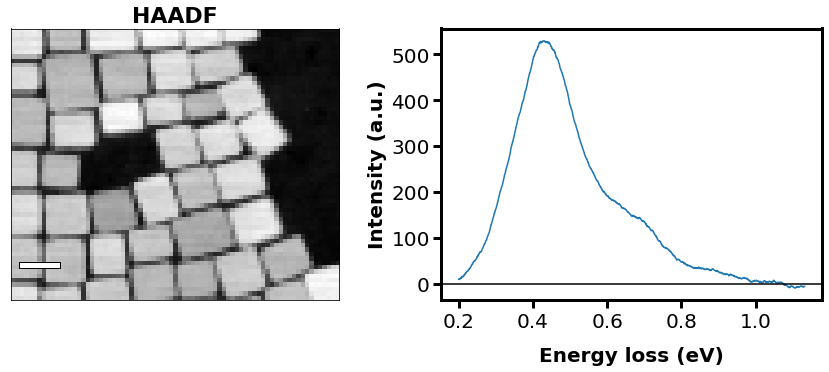

In [8]:
img = loadedfile['image']
specim = loadedfile['spectrum image']
e_ax = loadedfile['energy axis']
imscale = loadedfile['scale']

DisplayAverageData(figsize = (15,5),
                   scalebar = 15)

print(specim.shape)

* Prepare data for ML/DL:

((2820, 16, 16), (2820, 46))

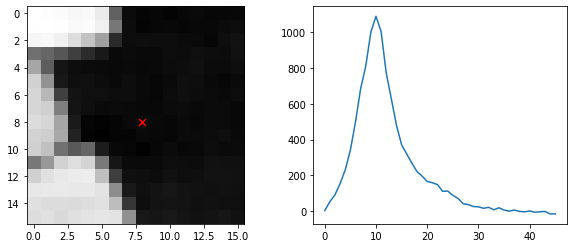

In [9]:
window_size       = 16              # select window size for geometric feature length scales
spectralavg       = 32              # average spectral channels (reduces # of channels significantly --> easier to process! usually don't need 2048 ch, a few hundred I think are sufficient)

coordinates = aoi.utils.get_coord_grid(img, step = 1, return_dict=False)
img_patches, specs, coords = aoi.utils.extract_patches_and_spectra(specim,
                                                                     img,
                                                                     coordinates=coordinates,
                                                                     window_size=window_size,
                                                                    #  band=[0, 2], # average over these slices and use as "structural data"
                                                                     avg_pool=spectralavg)

m = 50

fig,ax=plt.subplots(1,2,figsize=(10,4))
ax[0].imshow(img_patches[m], cmap = 'gray')
ax[1].plot(specs[m])
ax[0].scatter(window_size/2, window_size/2, marker = 'x', c='r', s=50)

img_patches.shape, specs.shape

In [10]:
full_img = np.copy(img)
indices = np.copy(coords)
features = np.copy(img_patches)
targets = np.copy(specs)
scale = np.copy(imscale)
e_scale = np.copy(e_ax[::spectralavg])

# Match the energy scale lengths (this only occurs from the spectral averaging in previous step)
while e_scale.shape[0] > targets[0].shape[0]:
  e_scale = e_scale[:-1]
  
e_scale.shape, targets[0].shape

((46,), (46,))

# Load and process

In [11]:
cd "/content"

/content


In [12]:
!mkdir DKL

In [13]:
cd "DKL"

/content/DKL


Preprocess:

In [14]:
norm_ = lambda x: (x - x.min()) / (x.max() - x.min())
features, targets = norm_(features), norm_(targets)

In [15]:
# Reduce the size of spectra via average pooling (for vector-DKL, the vector size should typically be < 200)
REDUCE = 1
y = torch.from_numpy(targets)[:, None]
y = torch.nn.functional.avg_pool1d(y, 1, 1).squeeze().numpy()

# Flatten image data
n, d1, d2 = features.shape
X = features.reshape(n, d1*d2)

# Transpose so that a spectrum length corresponds to a batch dimension in GP
y = y.T

e_reduced = np.copy(e_scale[::REDUCE])
while e_reduced.shape[0] > y.shape[0]:
  e_reduced = e_reduced[:-1]

# to use a scalar DKL-GPR, just take a single "slice" of y, e.g. y_sc = y[10:11]
print(y.shape, e_reduced.shape)

(46, 2820) (46,)


# DKL-GPR (no active learning)

## Full data

Initialize and train DKL-GPR model on the full dataset:

In [16]:
data_dim = X.shape[-1]

dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp.fit(X, y, training_cycles=100, lr=1e-2)

Epoch 1/100 ... Training loss: 34.1773
Epoch 10/100 ... Training loss: 32.6126
Epoch 20/100 ... Training loss: 30.8911
Epoch 30/100 ... Training loss: 29.1225
Epoch 40/100 ... Training loss: 27.3014
Epoch 50/100 ... Training loss: 25.4161
Epoch 60/100 ... Training loss: 23.4885
Epoch 70/100 ... Training loss: 21.519
Epoch 80/100 ... Training loss: 19.5071
Epoch 90/100 ... Training loss: 17.4558
Epoch 100/100 ... Training loss: 15.3644


Sample from the DKL-GP posterior over model outputs at the provided points (X) to compute mean prediction and associated uncertainty for each input image patch (here, we are basically checking how well our model fitted the data):

In [164]:
# samples = dklgp.sample_from_posterior(X, num_samples=1000)
# mean, var = samples.mean(0).T, samples.var(0).T # transpose so that "energy dimension" is the last one

# Alternatively, one can use the following prediction method that allows splitting the test data into mini-batches
# mean, var = dklgp.predict(X, batch_size=len(X))

Plot DKL-GPR prediction for a selected slice:

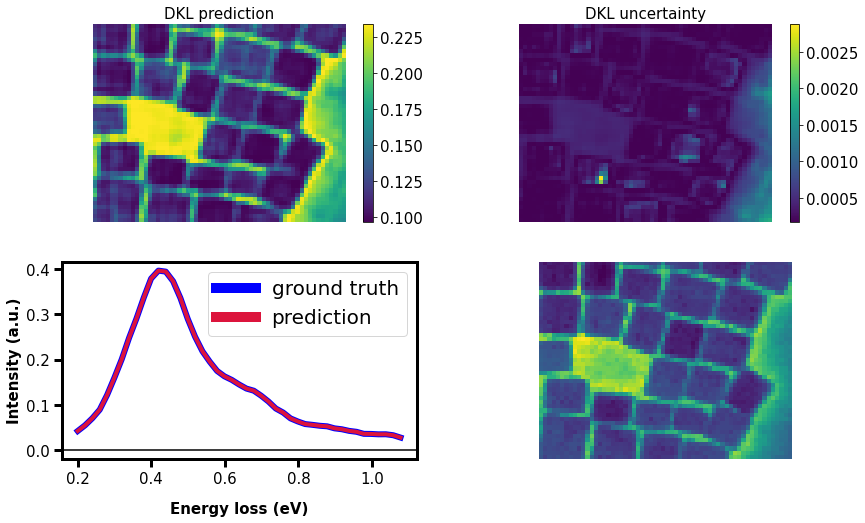

In [17]:
k1,k2 = 0,-1 # Specify energy range (in *pixels* not eV), 0 to -1 means full spectrum average


dkl_pred_full, dkl_unc_full, pred_spec_full, meas_spec_full, mean_full, var_full = plot_DKL_prediction_preacquired_notactive(dklgp,
                                                                                                                             full_img,
                                                                                                                             specim,
                                                                                                                             figsize = (14,8),
                                                                                                                             energy_range = [k1,k2])

* Select two different pixels in space, plot their measured and their predicted (DKL) spectra

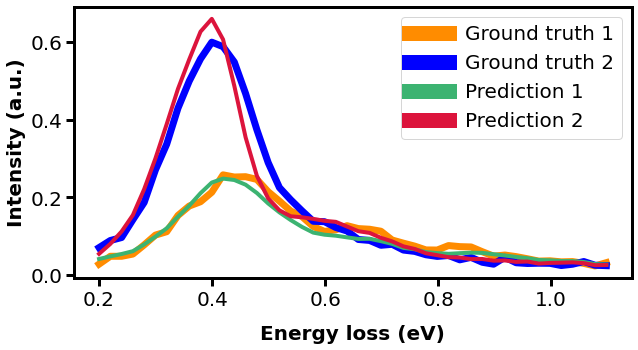

In [18]:
i1,j1 = 30, 24    
i2,j2 = 30, 58  

plt.figure(figsize=(10,5))
ax=plt.gca()

dkl_meas_full = y.T.reshape(dkl_pred_full.shape) 

ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
ax.plot(e_reduced, dkl_meas_full[i2,j2], linewidth=7, c='blue', label="Ground truth 2", zorder=0)
ax.plot(e_reduced, dkl_pred_full[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="Prediction 1", zorder=1)
ax.plot(e_reduced, dkl_pred_full[i2,j2], linewidth=4, c='crimson', alpha=1, label="Prediction 2", zorder=2)

ax.legend()
leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

* Average energy image (ground truth)

(-0.5, 74.5, -0.5, 61.5)

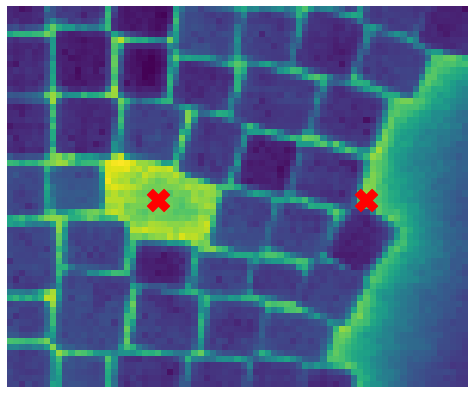

In [19]:
plt.figure(figsize=(9,7))
gs = gridspec.GridSpec(1,1)
ax1 = plt.subplot(gs[0])

ax1.imshow(np.mean(specim[:,:,k1:k2], axis = 2), origin = 'lower')
ax1.scatter(j1,i1, c='r', s=500, marker = 'X')
ax1.scatter(j2,i2, c='r', s=500, marker = 'X')

ax1.axis('off')

* Embedding layers

In [20]:
embeded = dklgp.embed(X)
embeded = embeded / embeded.max()

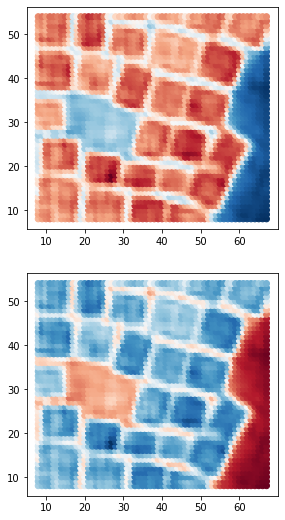

In [21]:
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(4.5, 9))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded[:, 1], cmap='RdBu')

## 10% data

In [22]:
fraction = 0.1

prng = RandomState(33)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

data_dim = X.shape[-1]

X_train = X[indices_partial]
y_train = y.T[indices_partial].T
indices_train = indices[indices_partial]

print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 282/2820 data points


In [23]:
dklgp10 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp10.fit(X_train, y_train, training_cycles=200, lr=1e-2)

Epoch 1/200 ... Training loss: 34.7578
Epoch 10/200 ... Training loss: 33.3349
Epoch 20/200 ... Training loss: 31.5703
Epoch 30/200 ... Training loss: 29.7486
Epoch 40/200 ... Training loss: 27.8818
Epoch 50/200 ... Training loss: 26.0437
Epoch 60/200 ... Training loss: 24.0877
Epoch 70/200 ... Training loss: 22.1104
Epoch 80/200 ... Training loss: 20.0986
Epoch 90/200 ... Training loss: 18.038
Epoch 100/200 ... Training loss: 15.9393
Epoch 110/200 ... Training loss: 13.803
Epoch 120/200 ... Training loss: 11.6294
Epoch 130/200 ... Training loss: 9.4262
Epoch 140/200 ... Training loss: 7.1966
Epoch 150/200 ... Training loss: 4.9422
Epoch 160/200 ... Training loss: 2.6627
Epoch 170/200 ... Training loss: 0.3642
Epoch 180/200 ... Training loss: -1.9033
Epoch 190/200 ... Training loss: -4.2633
Epoch 200/200 ... Training loss: -6.6288


Plot DKL-GPR prediction for a selected slice:

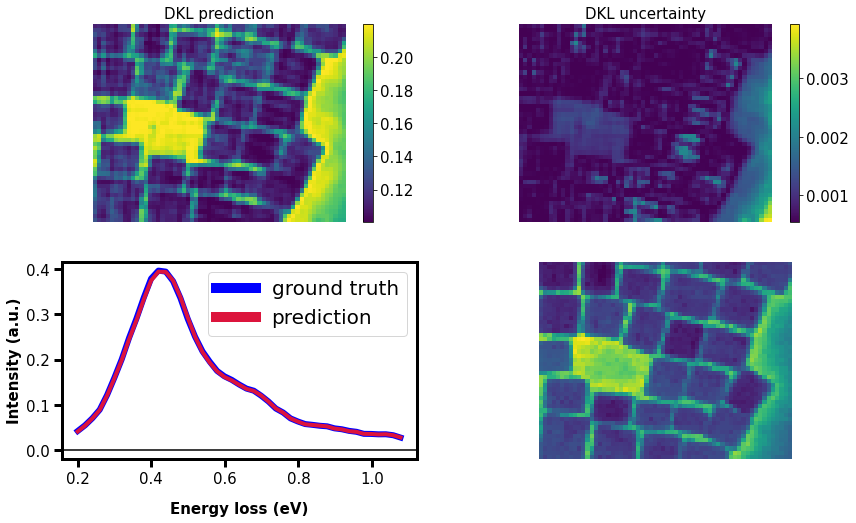

In [24]:
k1,k2 = 0,-1
dkl_pred10, dkl_unc10, pred_spec10, meas_spec10, mean10, var10 = plot_DKL_prediction_preacquired_notactive(dklgp10,
                                                                                                           full_img,
                                                                                                           specim,
                                                                                                           figsize = (14,8),
                                                                                                           energy_range = [k1,k2])

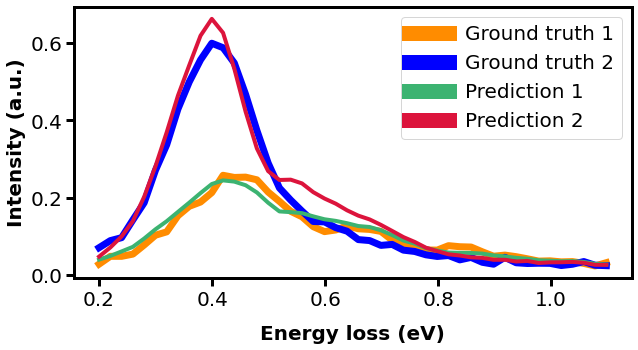

In [25]:
i1,j1 = 30, 24    
i2,j2 = 30, 58  

plt.figure(figsize=(10,5))
ax=plt.gca()

dkl_meas_full = y.T.reshape(dkl_pred_full.shape) 

ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
ax.plot(e_reduced, dkl_meas_full[i2,j2], linewidth=7, c='blue', label="Ground truth 2", zorder=0)
ax.plot(e_reduced,dkl_pred10[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred10[i2,j2], linewidth=4, c='crimson', alpha=1, label="Prediction 2", zorder=2)

ax.legend()
leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

* Embedding layers

In [26]:
embeded10 = dklgp10.embed(X)
embeded10 = embeded10 / embeded10.max()

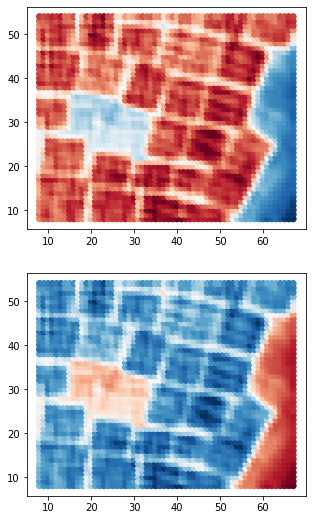

In [27]:
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(5, 9))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded10[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded10[:, 1], cmap='RdBu')

## 3% data

In [28]:
fraction = 0.03

prng = RandomState(22)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

X_train = X[indices_partial]
y_train = y.T[indices_partial].T
indices_train = indices[indices_partial]
print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 84/2820 data points


In [29]:
dklgp03 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp03.fit(X_train, y_train, training_cycles=200, lr=1e-2)

Epoch 1/200 ... Training loss: 35.5035
Epoch 10/200 ... Training loss: 34.3104
Epoch 20/200 ... Training loss: 32.3781
Epoch 30/200 ... Training loss: 30.4969
Epoch 40/200 ... Training loss: 28.6798
Epoch 50/200 ... Training loss: 26.7003
Epoch 60/200 ... Training loss: 24.719
Epoch 70/200 ... Training loss: 22.718
Epoch 80/200 ... Training loss: 20.7322
Epoch 90/200 ... Training loss: 18.6815
Epoch 100/200 ... Training loss: 16.5566
Epoch 110/200 ... Training loss: 14.4244
Epoch 120/200 ... Training loss: 12.2532
Epoch 130/200 ... Training loss: 10.0448
Epoch 140/200 ... Training loss: 7.7987
Epoch 150/200 ... Training loss: 5.8423
Epoch 160/200 ... Training loss: 3.3486
Epoch 170/200 ... Training loss: 1.0147
Epoch 180/200 ... Training loss: -1.347
Epoch 190/200 ... Training loss: -3.6985
Epoch 200/200 ... Training loss: -6.0582


Plot DKL-GPR prediction for a selected slice:

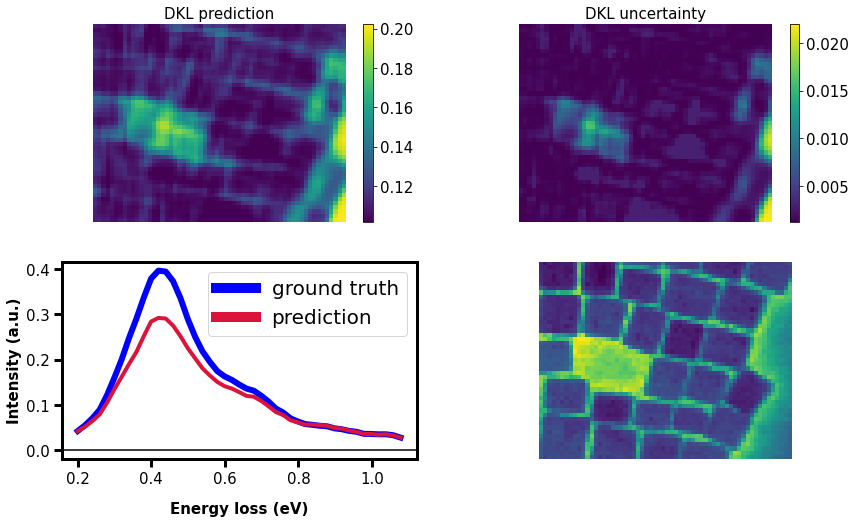

In [30]:
k1,k2 = 0,-1
dkl_pred03, dkl_unc03, pred_spec03, meas_spec03, mean03, var03 = plot_DKL_prediction_preacquired_notactive(dklgp03,
                                                                                                           full_img,
                                                                                                           specim,
                                                                                                           figsize = (14,8),
                                                                                                           energy_range = [k1,k2])

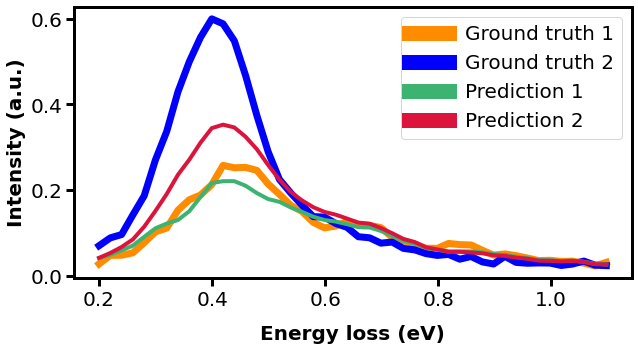

In [31]:
i1,j1 = 30, 24    
i2,j2 = 30, 58  

plt.figure(figsize=(10,5))
ax=plt.gca()

dkl_meas_full = y.T.reshape(dkl_pred_full.shape) 

ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
ax.plot(e_reduced, dkl_meas_full[i2,j2], linewidth=7, c='blue', label="Ground truth 2", zorder=0)
ax.plot(e_reduced,dkl_pred03[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred03[i2,j2], linewidth=4, c='crimson', alpha=1, label="Prediction 2", zorder=2)

ax.legend()
leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

In [32]:
embeded03 = dklgp03.embed(X)
embeded03 = embeded03 / embeded03.max()

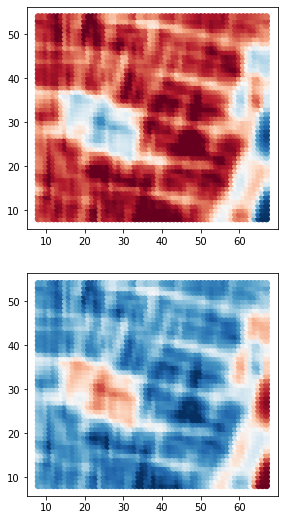

In [33]:
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(4.5, 9))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded03[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded03[:, 1], cmap='RdBu')

## 1% data

In [34]:
fraction = 0.01
prng = RandomState(42)
indices_partial = prng.choice(len(indices), size=int(fraction*len(indices)), replace=False)

X_train = X[indices_partial]
y_train = y.T[indices_partial].T
indices_train = indices[indices_partial]
print("Training with {}/{} data points".format(len(indices_train), len(indices)))

Training with 28/2820 data points


In [35]:
dklgp01 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp01.fit(X_train, y_train, training_cycles=200, lr=1e-2)

Epoch 1/200 ... Training loss: 37.1525
Epoch 10/200 ... Training loss: 36.1154
Epoch 20/200 ... Training loss: 34.1585
Epoch 30/200 ... Training loss: 32.1647
Epoch 40/200 ... Training loss: 30.2012
Epoch 50/200 ... Training loss: 28.2248
Epoch 60/200 ... Training loss: 26.228
Epoch 70/200 ... Training loss: 24.1987
Epoch 80/200 ... Training loss: 22.3094
Epoch 90/200 ... Training loss: 20.1368
Epoch 100/200 ... Training loss: 17.9401
Epoch 110/200 ... Training loss: 15.7568
Epoch 120/200 ... Training loss: 13.5436
Epoch 130/200 ... Training loss: 11.3162
Epoch 140/200 ... Training loss: 9.0613
Epoch 150/200 ... Training loss: 6.8021
Epoch 160/200 ... Training loss: 4.5329
Epoch 170/200 ... Training loss: 2.2547
Epoch 180/200 ... Training loss: -0.0309
Epoch 190/200 ... Training loss: -2.3236
Epoch 200/200 ... Training loss: -4.6244


Plot DKL-GPR prediction for a selected slice:

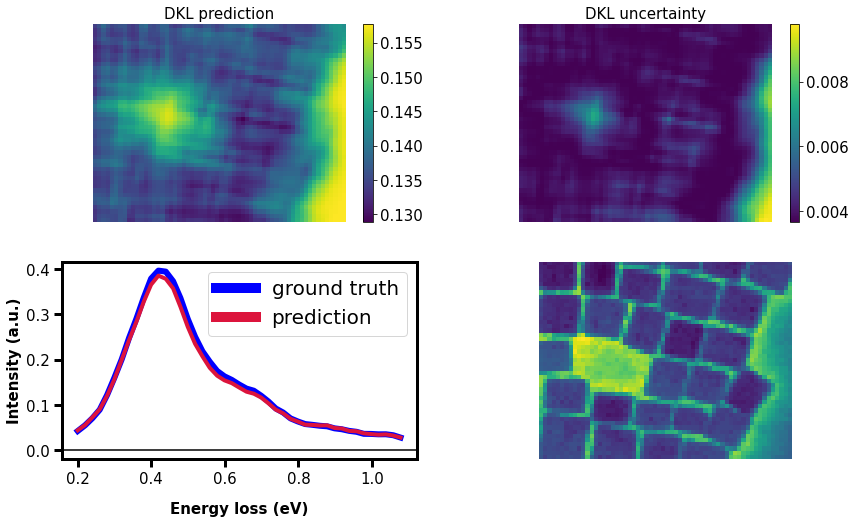

In [36]:
k1,k2 = 0,-1
dkl_pred01, dkl_unc01, pred_spec01, meas_spec01, mean01, var01 = plot_DKL_prediction_preacquired_notactive(dklgp01,
                                                                                                           full_img,
                                                                                                           specim,
                                                                                                           figsize = (14,8),
                                                                                                           energy_range = [k1,k2])

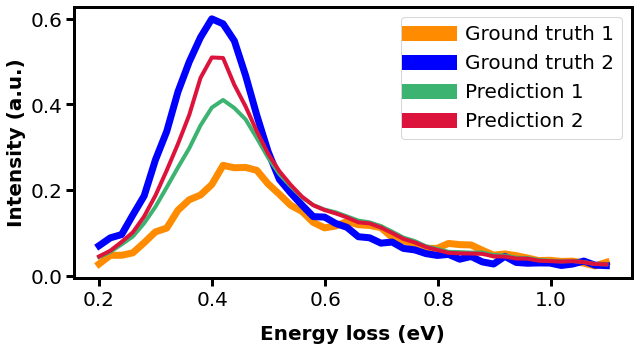

In [37]:
i1,j1 = 30, 24    
i2,j2 = 30, 58  

plt.figure(figsize=(10,5))
ax=plt.gca()

dkl_meas_full = y.T.reshape(dkl_pred_full.shape) 

ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
ax.plot(e_reduced, dkl_meas_full[i2,j2], linewidth=7, c='blue', label="Ground truth 2", zorder=0)
ax.plot(e_reduced,dkl_pred01[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred01[i2,j2], linewidth=4, c='crimson', alpha=1, label="Prediction 2", zorder=2)

ax.legend()
leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

* Embedding layers

In [38]:
embeded01 = dklgp01.embed(X)
embeded01 = embeded01 / embeded01.max()

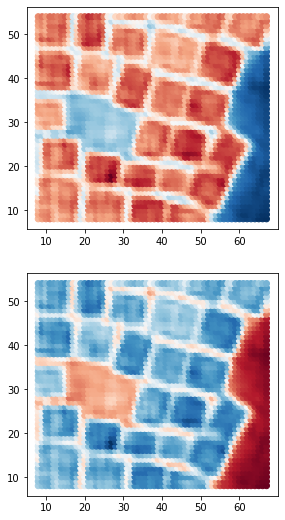

In [39]:
_, (ax1, ax2) = plt.subplots(2, 1, figsize=(4.5, 9))
ax1.scatter(indices[:, 1], indices[:, 0], c=embeded[:, 0], cmap='RdBu')
ax2.scatter(indices[:, 1], indices[:, 0], c=embeded[:, 1], cmap='RdBu')

### Collect results

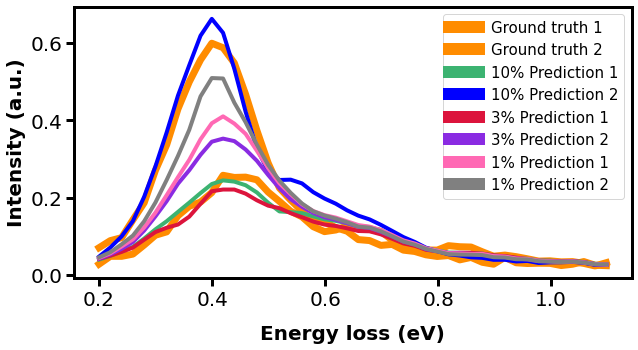

In [40]:
plt.figure(figsize=(10,5))
ax=plt.gca()


ax.plot(e_reduced, dkl_meas_full[i1,j1], linewidth=7, c='darkorange', label="Ground truth 1", zorder=0)
ax.plot(e_reduced, dkl_meas_full[i2,j2], linewidth=7, c='darkorange', label="Ground truth 2", zorder=0)
ax.plot(e_reduced,dkl_pred10[i1,j1], linewidth=4, c='mediumseagreen', alpha=1, label="10% Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred10[i2,j2], linewidth=4, c='blue', alpha=1, label="10% Prediction 2", zorder=1)
ax.plot(e_reduced,dkl_pred03[i1,j1], linewidth=4, c='crimson', alpha=1, label="3% Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred03[i2,j2], linewidth=4, c='blueviolet', alpha=1, label="3% Prediction 2", zorder=1)
ax.plot(e_reduced,dkl_pred01[i1,j1], linewidth=4, c='hotpink', alpha=1, label="1% Prediction 1", zorder=1)
ax.plot(e_reduced,dkl_pred01[i2,j2], linewidth=4, c='gray', alpha=1, label="1% Prediction 2", zorder=1)
ax.legend()

leg=ax.legend(fontsize = 15)
for line in leg.get_lines():
  line.set_linewidth(12)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)

for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

* Average prediction

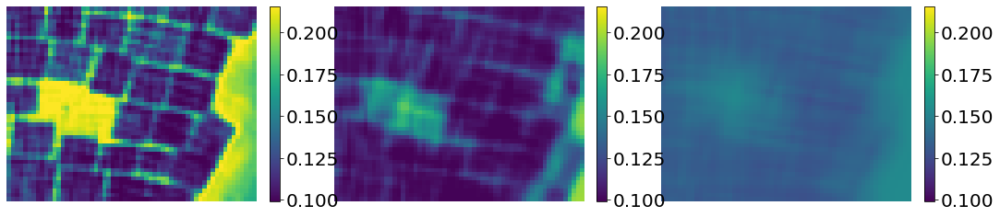

In [41]:
cmax = np.asarray([np.mean(dkl_pred10, axis = 2), np.mean(dkl_pred03, axis = 2), np.mean(dkl_pred01, axis = 2)]).max()
cmin = np.asarray([np.mean(dkl_pred10, axis = 2), np.mean(dkl_pred03, axis = 2), np.mean(dkl_pred01, axis = 2)]).min()

cmin,cmax

plt.figure(figsize=(18,7))
gs = gridspec.GridSpec(1,3)
ax1,ax2,ax3 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])

im1 = ax1.imshow(np.mean(dkl_pred10, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)
im2 = ax2.imshow(np.mean(dkl_pred03, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)
im3 = ax3.imshow(np.mean(dkl_pred01, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)

cbar1 = plt.colorbar(im1, ax = ax1, fraction = 0.036)
cbar2 = plt.colorbar(im2, ax = ax2, fraction = 0.036)
cbar3 = plt.colorbar(im3, ax = ax3, fraction = 0.036)

cbar1.ax.tick_params(labelsize = 20)
cbar2.ax.tick_params(labelsize = 20)
cbar3.ax.tick_params(labelsize = 20)

ax1.axis('off'), ax2.axis('off'), ax3.axis('off');

Average uncertainty

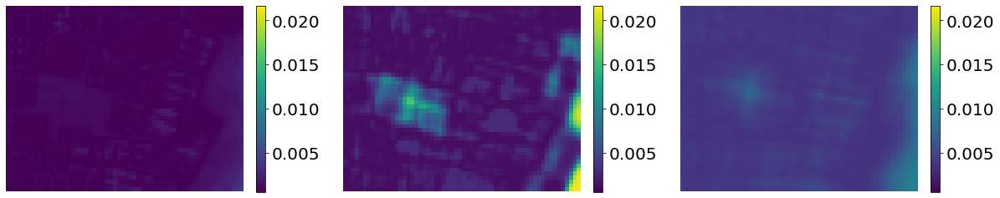

In [53]:
cmax = np.asarray([np.mean(dkl_unc10, axis = 2), np.mean(dkl_unc03, axis = 2), np.mean(dkl_unc01, axis = 2)]).max()
cmin = np.asarray([np.mean(dkl_unc10, axis = 2), np.mean(dkl_unc03, axis = 2), np.mean(dkl_unc01, axis = 2)]).min()

cmin,cmax

plt.figure(figsize=(20,7))
gs = gridspec.GridSpec(1,3, wspace = 0.3)
ax1,ax2,ax3 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2])

im1 = ax1.imshow(np.mean(dkl_unc10, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)
im2 = ax2.imshow(np.mean(dkl_unc03, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)
im3 = ax3.imshow(np.mean(dkl_unc01, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)

cbar1 = plt.colorbar(im1, ax = ax1, fraction = 0.036)
cbar2 = plt.colorbar(im2, ax = ax2, fraction = 0.036)
cbar3 = plt.colorbar(im3, ax = ax3, fraction = 0.036)

cbar1.ax.tick_params(labelsize = 20)
cbar2.ax.tick_params(labelsize = 20)
cbar3.ax.tick_params(labelsize = 20)

ax1.axis('off'), ax2.axis('off'), ax3.axis('off');

* Big fig

In [52]:
cmin, cmax

(0.0005440185253250048, 0.021692797916894043)

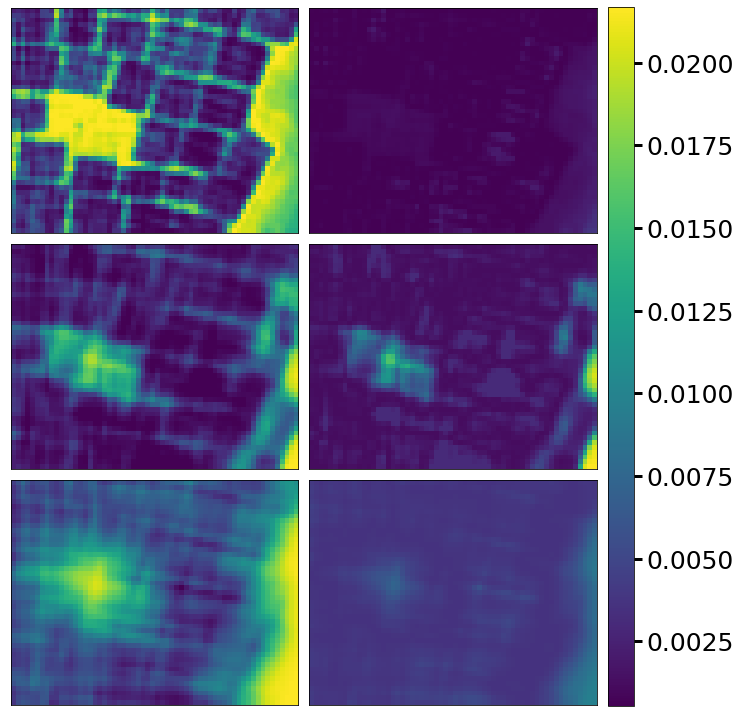

In [78]:
Preds = [dkl_pred10.mean(2), dkl_pred03.mean(2), dkl_pred01.mean(2)]
Uncertains = [dkl_unc10.mean(2), dkl_unc03.mean(2), dkl_unc01.mean(2)]

###############################################################
fig = plt.figure(figsize=(10.5,13))
gs = gridspec.GridSpec(3,2, wspace = 0.04, hspace = 0.01)

for ii in range(3):
    ax = fig.add_subplot(gs[ii,0])
    ax.imshow(Preds[ii], origin = 'lower')
    plt.setp(ax, xticks=[], yticks=[])
for ii in range(3):
    ax = fig.add_subplot(gs[ii,1])
    im = ax.imshow(Uncertains[ii], origin = 'lower', vmin = cmin, vmax = cmax)
    plt.setp(ax, xticks=[], yticks=[])




cbar_ax = fig.add_axes([0.915, 0.129, 0.035, 0.747])
fig.colorbar(im, cax=cbar_ax)
cbar_ax.tick_params(labelsize = 25, width = 3, length = 8)

# Active learning

* This is where physics is embedded into the model!
* We need to define a function that will scalarize our vector-valued acquisition function. Here, we simply take an average over a selected energy band
* However this can be anything we can imagine that can be done to the spectrum

In [157]:
def scalarize_acq(obj: np.ndarray) -> np.ndarray:
    """
    Scalarize acquisition function (n_samples x vector_size)
    by averaging over a selected energy band.
    """
    band = [0, -1]
    obj = obj[:, band[0]:band[1]].mean(-1)
    return obj

We start with a small number (2) of randomly sampled measurements and use DKL-GPR predictions to guide the sample exploration via pre-defined acquisition functions:

In [158]:
# Here X_train and y_train are our measured image patches (HAADF) and spectra/peaks (EELS),
# whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
# whereas the indices_test are the grid coordinates of the remaining available points on the grid

(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X, y.T, indices, test_size=0.999, shuffle=True, random_state=20)

# The targets for the DKL-GPR must have vector_size x n_samples dimensions where vector_size is equal to spectral length
y_train = y_train.T
y_test = y_test.T

print(X_train.shape) # n_samples x n_features
print(y_train.shape) # vector_size x n_samples 

(2, 256)
(46, 2)


Run the "experiment":

* Note, if you prefer to skip ahead and not wait for this training, please go to the next section titled "**Load and reconstruct**"

In [ ]:
# Memory dump if (GPU) memory usage is high

# import gc
# dklgp_new = None
# gc.collect()
# torch.cuda.empty_cache()
# with torch.no_grad():
#     torch.cuda.empty_cache()

1/40
Epoch 1/20 ... Training loss: 44.0791
Epoch 10/20 ... Training loss: 41.9964
Epoch 20/20 ... Training loss: 39.7659


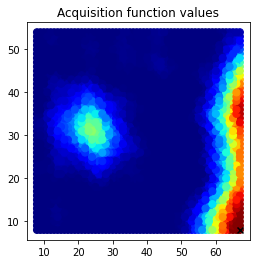

2/40
Epoch 1/20 ... Training loss: 43.23
Epoch 10/20 ... Training loss: 42.7137
Epoch 20/20 ... Training loss: 40.3951


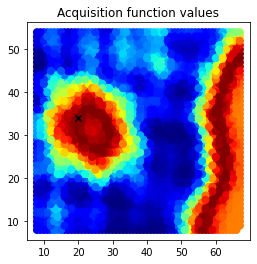

3/40
Epoch 1/20 ... Training loss: 42.9002
Epoch 10/20 ... Training loss: 42.7756
Epoch 20/20 ... Training loss: 40.3926


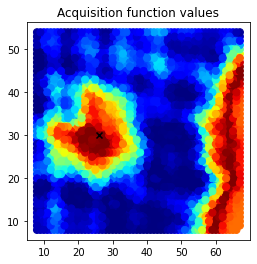

4/40
Epoch 1/20 ... Training loss: 42.1509
Epoch 10/20 ... Training loss: 41.9967
Epoch 20/20 ... Training loss: 39.6159


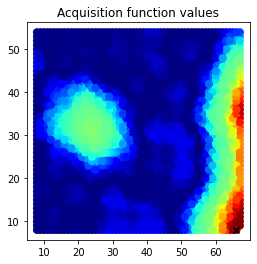

5/40
Epoch 1/20 ... Training loss: 41.5261
Epoch 10/20 ... Training loss: 41.8295
Epoch 20/20 ... Training loss: 39.1788


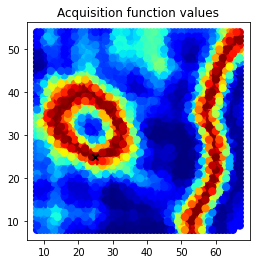

6/40
Epoch 1/20 ... Training loss: 41.119
Epoch 10/20 ... Training loss: 41.3103
Epoch 20/20 ... Training loss: 38.5722


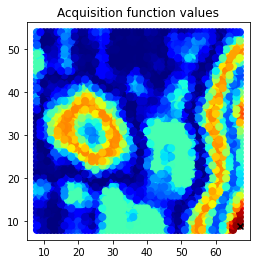

7/40
Epoch 1/20 ... Training loss: 40.6661
Epoch 10/20 ... Training loss: 40.5616
Epoch 20/20 ... Training loss: 38.3121


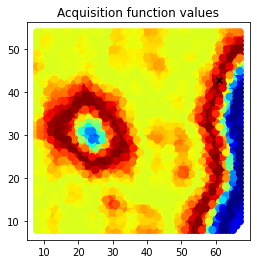

8/40
Epoch 1/20 ... Training loss: 40.3308
Epoch 10/20 ... Training loss: 40.0575
Epoch 20/20 ... Training loss: 37.7552


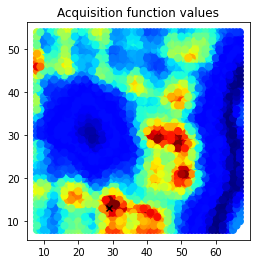

9/40
Epoch 1/20 ... Training loss: 40.0885
Epoch 10/20 ... Training loss: 39.9638
Epoch 20/20 ... Training loss: 37.7693


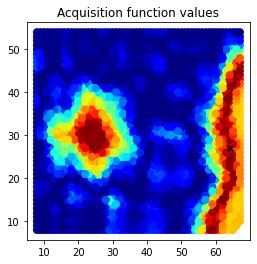

10/40
Epoch 1/20 ... Training loss: 39.8303
Epoch 10/20 ... Training loss: 39.3937
Epoch 20/20 ... Training loss: 37.4212


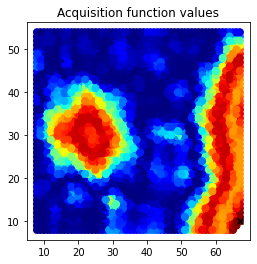

11/40
Epoch 1/20 ... Training loss: 39.565
Epoch 10/20 ... Training loss: 39.0241
Epoch 20/20 ... Training loss: 37.056


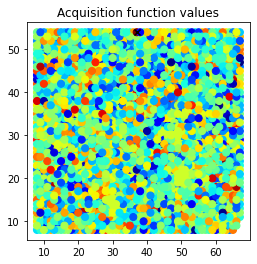

12/40
Epoch 1/20 ... Training loss: 39.3348
Epoch 10/20 ... Training loss: 39.1716
Epoch 20/20 ... Training loss: 36.9345


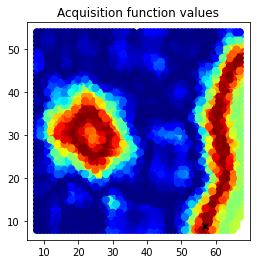

13/40
Epoch 1/20 ... Training loss: 39.1038
Epoch 10/20 ... Training loss: 38.6524
Epoch 20/20 ... Training loss: 36.3512


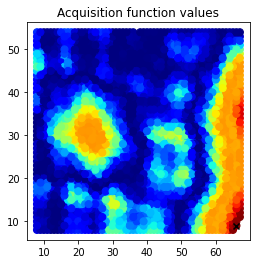

14/40
Epoch 1/20 ... Training loss: 38.9111
Epoch 10/20 ... Training loss: 38.5287
Epoch 20/20 ... Training loss: 36.3229


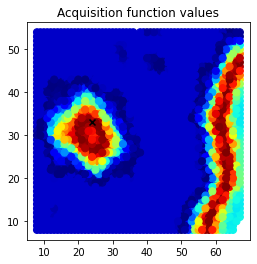

15/40
Epoch 1/20 ... Training loss: 38.7376
Epoch 10/20 ... Training loss: 38.2766
Epoch 20/20 ... Training loss: 36.1323


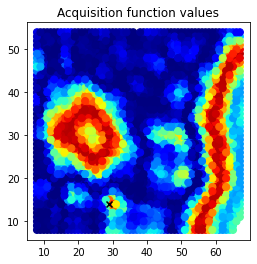

16/40
Epoch 1/20 ... Training loss: 38.5784
Epoch 10/20 ... Training loss: 37.7671
Epoch 20/20 ... Training loss: 35.8174


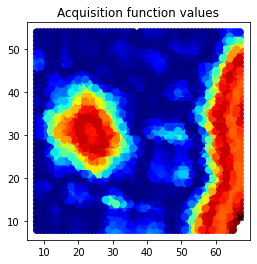

17/40
Epoch 1/20 ... Training loss: 38.4293
Epoch 10/20 ... Training loss: 38.4356
Epoch 20/20 ... Training loss: 36.0407


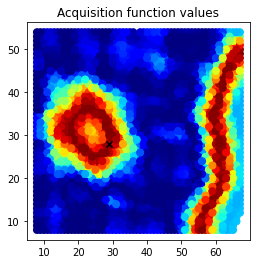

18/40
Epoch 1/20 ... Training loss: 38.3012
Epoch 10/20 ... Training loss: 38.0368
Epoch 20/20 ... Training loss: 35.9374


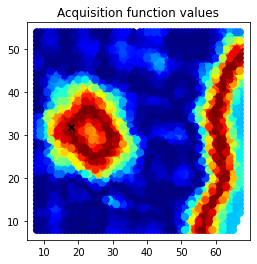

19/40
Epoch 1/20 ... Training loss: 38.186
Epoch 10/20 ... Training loss: 37.2789
Epoch 20/20 ... Training loss: 35.4683


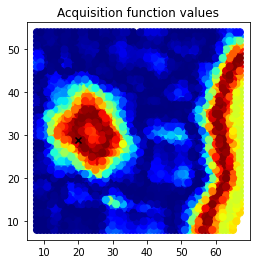

20/40
Epoch 1/20 ... Training loss: 38.0703
Epoch 10/20 ... Training loss: 37.5852
Epoch 20/20 ... Training loss: 35.6021


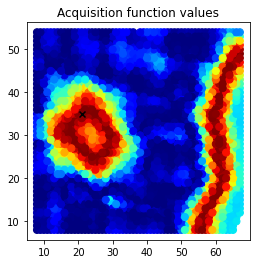

21/40
Epoch 1/20 ... Training loss: 37.9588
Epoch 10/20 ... Training loss: 37.2289
Epoch 20/20 ... Training loss: 35.3855


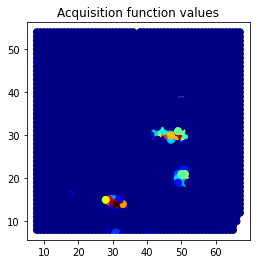

22/40
Epoch 1/20 ... Training loss: 37.8665
Epoch 10/20 ... Training loss: 37.0369
Epoch 20/20 ... Training loss: 35.0573


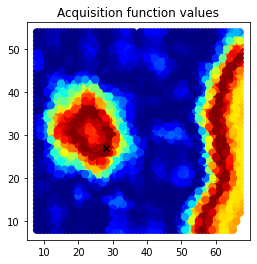

23/40
Epoch 1/20 ... Training loss: 37.7659
Epoch 10/20 ... Training loss: 37.0357
Epoch 20/20 ... Training loss: 35.0261


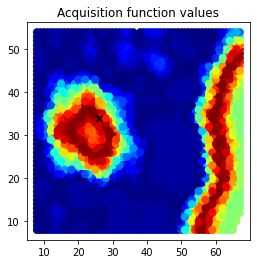

24/40
Epoch 1/20 ... Training loss: 37.6685
Epoch 10/20 ... Training loss: 36.9115
Epoch 20/20 ... Training loss: 34.9125


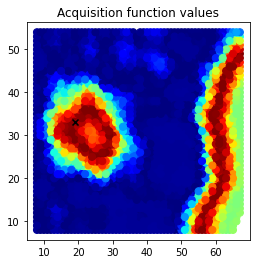

25/40
Epoch 1/20 ... Training loss: 37.5941
Epoch 10/20 ... Training loss: 36.6517
Epoch 20/20 ... Training loss: 34.7473


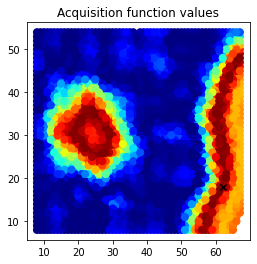

26/40
Epoch 1/20 ... Training loss: 37.4971
Epoch 10/20 ... Training loss: 36.8556
Epoch 20/20 ... Training loss: 34.8774


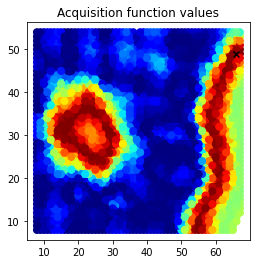

27/40
Epoch 1/20 ... Training loss: 37.4179
Epoch 10/20 ... Training loss: 36.7039
Epoch 20/20 ... Training loss: 34.713


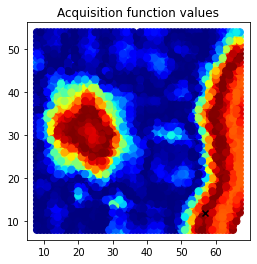

28/40
Epoch 1/20 ... Training loss: 37.3368
Epoch 10/20 ... Training loss: 36.6728
Epoch 20/20 ... Training loss: 34.4883


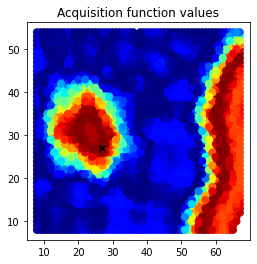

29/40
Epoch 1/20 ... Training loss: 37.2593
Epoch 10/20 ... Training loss: 36.3104
Epoch 20/20 ... Training loss: 34.4126


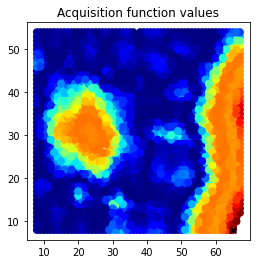

30/40
Epoch 1/20 ... Training loss: 37.1997
Epoch 10/20 ... Training loss: 36.3617
Epoch 20/20 ... Training loss: 34.5499


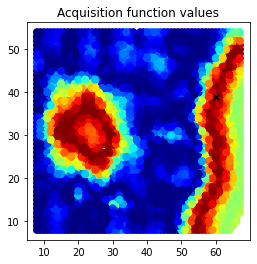

31/40
Epoch 1/20 ... Training loss: 37.1412
Epoch 10/20 ... Training loss: 36.145
Epoch 20/20 ... Training loss: 34.2187


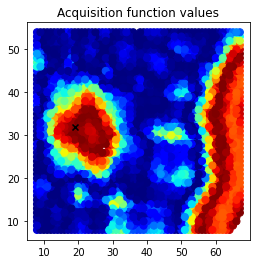

32/40
Epoch 1/20 ... Training loss: 37.1029
Epoch 10/20 ... Training loss: 36.2466
Epoch 20/20 ... Training loss: 34.4063


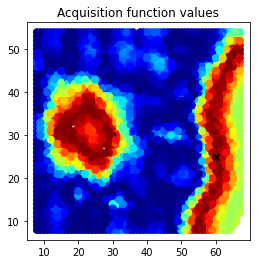

33/40
Epoch 1/20 ... Training loss: 37.0673
Epoch 10/20 ... Training loss: 36.2799
Epoch 20/20 ... Training loss: 34.3277


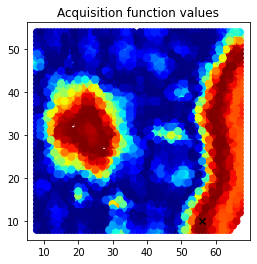

34/40
Epoch 1/20 ... Training loss: 37.0016
Epoch 10/20 ... Training loss: 36.1992
Epoch 20/20 ... Training loss: 34.1037


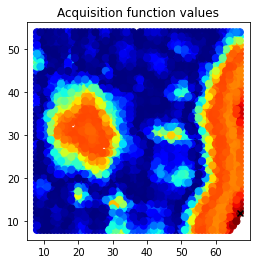

35/40
Epoch 1/20 ... Training loss: 36.9541
Epoch 10/20 ... Training loss: 35.9902
Epoch 20/20 ... Training loss: 34.2124


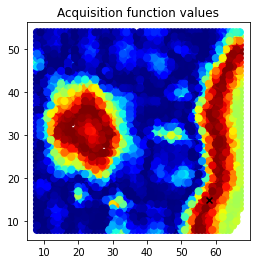

36/40
Epoch 1/20 ... Training loss: 36.8928
Epoch 10/20 ... Training loss: 35.964
Epoch 20/20 ... Training loss: 34.0486


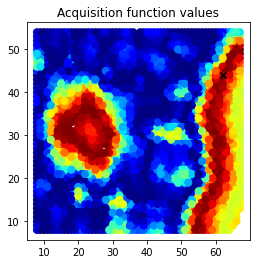

37/40
Epoch 1/20 ... Training loss: 36.8371
Epoch 10/20 ... Training loss: 35.8944
Epoch 20/20 ... Training loss: 33.9384


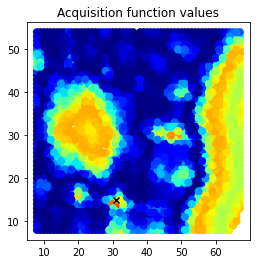

38/40
Epoch 1/20 ... Training loss: 36.7922
Epoch 10/20 ... Training loss: 35.7282
Epoch 20/20 ... Training loss: 33.8739


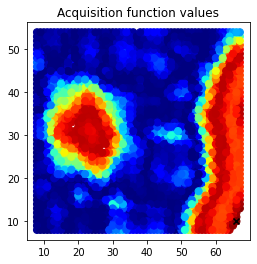

39/40
Epoch 1/20 ... Training loss: 36.7548
Epoch 10/20 ... Training loss: 36.0218
Epoch 20/20 ... Training loss: 34.1062


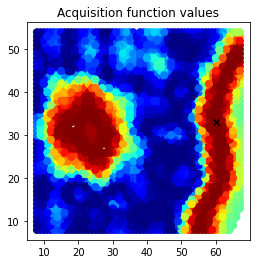

40/40
Epoch 1/20 ... Training loss: 36.7037
Epoch 10/20 ... Training loss: 35.6597
Epoch 20/20 ... Training loss: 33.8831


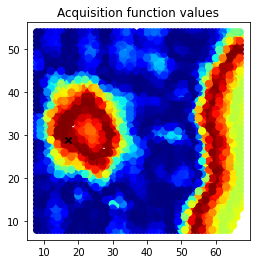

In [159]:
exploration_steps = 40  # 200 is about 7% of the points --> ~10-15 minute execution time! Note, 100 steps only takes ~3 min

xi = 0.01                # balances exploration and exploitation for EI

################################################################################
import time  # NEW LINE
time_all = []  # NEW LINE

AF_results = []
data_dim = X_train.shape[-1]
for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    start_time = time.time()  # NEW LINE
    training_iter = 20 if e < 100 else 40  # we do not want to "overfit" our model at the beginning

    # update GP posterior
    dklgp_new = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
    dklgp_new.fit(X_train, y_train, training_cycles=training_iter)

    # Compute the acquisition function
    best_f = torch.tensor(dklgp_new.predict(X_train)[0].max())
    obj = EI(dklgp_new, X_test, best_f, xi)

    # SAVE current acquisition function
    AF = save_result(indices_test, obj)
    AF_results.append(AF)

    obj = obj.T # transpose to n_samples x vector_size  for consistency
  
    # Scalarize the acquisition function
    obj = scalarize_acq(obj)

    # Select the next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[:, next_point_idx]

    # Plot current result
    plot_result(indices_test, obj, e)

    # SAVE current MODEL WEIGHTS
    state_dict = dklgp_new.gp_model.state_dict()
    torch.save(state_dict, "Model_ActiveDKL {}.pt".format(e))

    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)
    time_all.append(time.time() - start_time)  # NEW LINE

Plot the visited points:

Overlay the explored point with a ground truth (again, we only will have a ground truth for *pre*-acquired data):

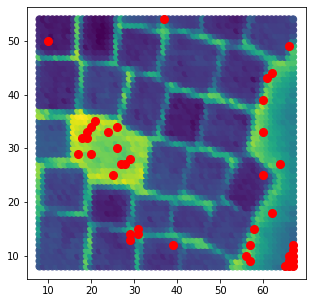

In [160]:
plt.figure(figsize=(5, 5))
plt.scatter(indices[:, 1], indices[:, 0], s=50, c=scalarize_acq(y.T))
plt.scatter(indices_train[:, 1], indices_train[:, 0], s=64, c='r')

Rather successful in finding intended behavior (defined by the "scalarize_acq" function)

* Zip all the weights, then download





In [ ]:
%%capture
!zip -r /content/DKLweights_01.zip /content/DKL

* Save and, if interested, download results (model weights in DKLweights zip, and acquisition function in AF_results)

In [ ]:
 download = False

filename = "Acquisition_functions.npy"
np.save(filename, AF_results)

from google.colab import files
if download:
  files.download("DKLweights_01.zip")
  files.download(filename)

#### (Checkpoint) Load and reconstruct

In [21]:
%%capture

# Download the weights from a previously (actively) trained model
!wget https://www.dropbox.com/s/xl5745l7mp3ph3m/DKLweights_01.zip
!unzip "DKLweights_01.zip"
!rm DKLweights_01.zip

# Download the acquisition functions from a previously (actively) trained model
!wget https://www.dropbox.com/s/zc9ua64bi4348bw/ActiveDKL_FITOedge_10%.npy
AF_results = np.load("ActiveDKL_FITOedge_10%.npy", allow_pickle = True)

### AF movies

In [22]:
# Movies
def silence_imageio_warning(*args, **kwargs):
    pass
imageio.core.util._precision_warn = silence_imageio_warning

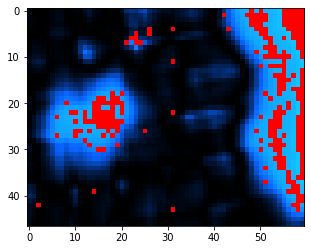

In [23]:
structural_img = np.copy(full_img)
AF_all, AF_all_color_combo, AF_combined = Make_AF_movies_preacquired(acquisition_functions = AF_results,
                                                                     RGB = Blue,
                                                                     brightness = 2,
                                                                     measured_points_in_AF = [1,0,0],
                                                                     measured_points_in_HAADF = [1,0,0])

plt.imshow(AF_all_color_combo[-1])

In [24]:
size_increase = 6

HAADF_mov = create_point_search_mov_preacquired(full_img, AF_combined, size = structural_img.shape, point_radius = 1, point_color = [1,0,0], offset = 0)
AF_resized = resize(AF_all_color_combo, HAADF_mov.shape)
Movie_combined = np.concatenate((AF_resized, HAADF_mov), axis = 2)

s1,s2,s3,s4 =  Movie_combined.shape
Movie_combined_upscaled = resize(Movie_combined, (s1,s2*size_increase,s3*size_increase,s4))

* View the A.F. at the last step:

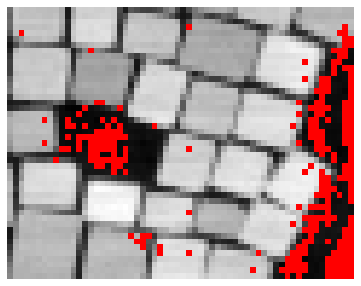

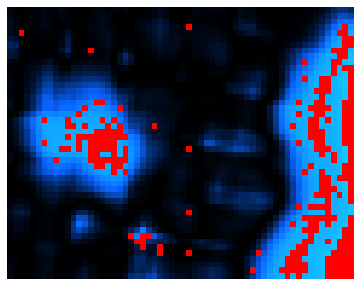

In [25]:
step = -1

plt.figure(figsize=(9,5))
ax=plt.gca()
plt.imshow(HAADF_mov[step], origin = 'lower')
ax.axis('off')

plt.figure(figsize=(9,5))
ax=plt.gca()
plt.imshow(AF_resized[step], origin = 'lower')
ax.axis('off');

* Or view the A.F. at only a few points visited:

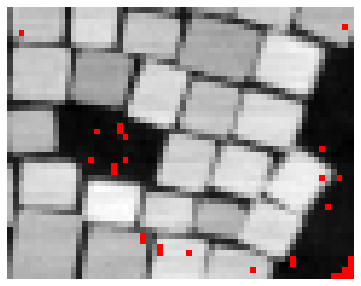

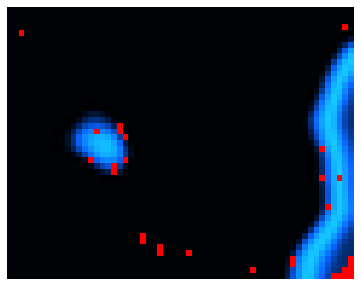

In [27]:
fraction = 0.01

step = int(fraction*X.shape[0])

plt.figure(figsize=(9,5))
ax=plt.gca()
plt.imshow(HAADF_mov[step], origin = 'lower')
ax.axis('off')

plt.figure(figsize=(9,5))
ax=plt.gca()
plt.imshow(AF_resized[step], origin = 'lower')
ax.axis('off');

* Create a movie

In [29]:
Mov_name = "AcquisitionFunction_mov1.mp4"

imageio.mimwrite(Mov_name, Movie_combined_upscaled, fps = 10)
Video(Mov_name, embed = True)

* Download if desired

In [36]:
download = True

from google.colab import files
if download:
  files.download(Mov_name)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Reconstructions/Predictions

* Load and evaluate model performance at specific fractions of measured data points

In [40]:
cd '/content/DKL/content/DKL'

/content/DKL/content/DKL


In [41]:
weights_files = []
weights_files = sorted(glob.glob('*.pt'))
len(weights_files)

266

* Use model at this step.... (note, later cells use a function to accomplish the following two cells)

In [42]:
step = 10  # model step from which to load weights

#####################################
### do not change below parameters ###
#####################################

weights = weights_files[step]
device = 'cpu'            # constant
dtype = torch.float64     # constant

dklgp_trained =  aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp_trained.compile_trainer(X, y) # extra step. 

# Load trained weights
state_dict = torch.load(weights)
dklgp_trained.gp_model.load_state_dict(state_dict)

<All keys matched successfully>

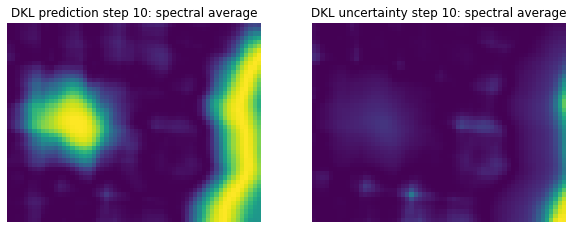

In [43]:
mean,var = dklgp_trained.predict(X, batch_size = len(X))

s1, s2 = structural_img.shape[0] - window_size+1, structural_img.shape[1] - window_size+1
s3 = y.shape[0]

dkl_prediction = np.full((s1*s2,s3), np.nan)
dkl_uncertainty = np.full((s1*s2,s3), np.nan)

for ii in range(indices[:,0].shape[0]):
  dkl_prediction[ii] = mean.T[ii, :]
  dkl_uncertainty[ii] = var.T[ii, :]

dkl_prediction = dkl_prediction.reshape((s1,s2,s3))
dkl_uncertainty = dkl_uncertainty.reshape((s1,s2,s3))

plt.figure(figsize=(10,5))
gs = gridspec.GridSpec(1,2)
ax1,ax2 = plt.subplot(gs[0]), plt.subplot(gs[1])

k1,k2 = 0, -1
ax1.imshow(np.mean(dkl_prediction[:,:,k1:k2],axis = 2), origin = 'lower')
ax2.imshow(np.mean(dkl_uncertainty[:,:,k1:k2], axis = 2), origin = 'lower')

ax1.set_title('DKL prediction step {}: spectral average'.format(step))
ax2.set_title('DKL uncertainty step {}: spectral average'.format(step))

ax1.axis('off'), ax2.axis('off');

#### 10%

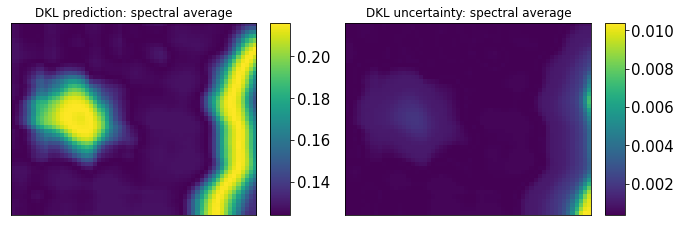

In [44]:
step = -1

k1,k2 = 0,-1  # average over full spectrum
pred10,unc10,mean10,var10 = plot_DKL_prediction_preacquired(weights_files, 
                                                            step = step, 
                                                            embed = 2, 
                                                            precision = "double", 
                                                            figsize = (11,4),
                                                            energy_range = [k1,k2], 
                                                            colorscale = True)

#### 3%

84

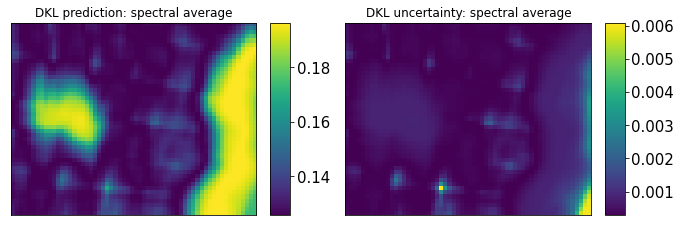

In [45]:
fraction = 0.03
k1,k2 = 0,-1  # average over full spectrum

step = int(fraction*X.shape[0])
pred03,unc03,mean03,var03 = plot_DKL_prediction_preacquired(weights_files, 
                                           step = step, 
                                           embed = 2, 
                                           precision = "double", 
                                           figsize = (11,4),
                                           energy_range = [k1,k2],
                                           colorscale = True)
step

#### 1%

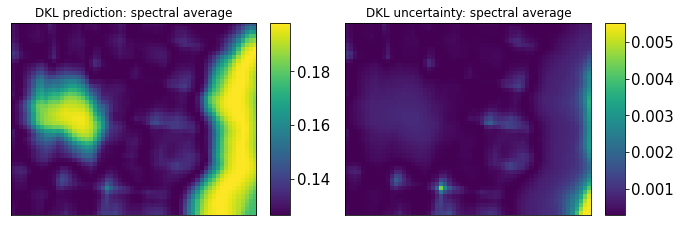

In [46]:
fraction = 0.01
k1,k2 = 0,-1  # average over full spectrum

step = int(fraction*X.shape[0])
pred01,unc01,mean01,var01 = plot_DKL_prediction_preacquired(weights_files, 
                                           step = 27, 
                                           embed = 2, 
                                           precision = "double", 
                                           figsize = (11,4),
                                           energy_range = [k1,k2],
                                           colorscale = True)

#### 0.1%
3 data points in total

2

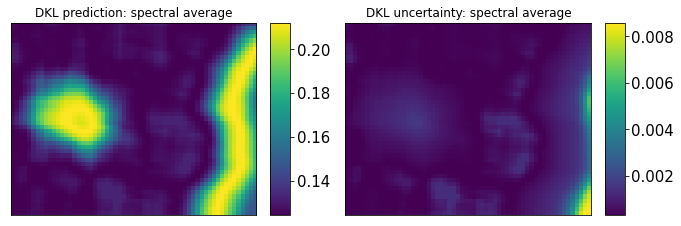

In [47]:
fraction = 0.001
k1,k2 = 0,-1  # average over full spectrum

step = int(fraction*X.shape[0])
pred001,unc001,mean001,var001 = plot_DKL_prediction_preacquired(weights_files, 
                                           step = step, 
                                           embed = 2, 
                                           precision = "double", 
                                           figsize = (11,4),
                                           energy_range = [k1,k2],
                                           colorscale = True)
step

### Collect results

* Predictions

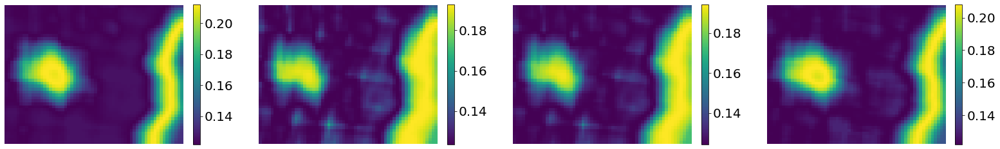

In [48]:
plt.figure(figsize=(26.67,7))
gs = gridspec.GridSpec(1,4, wspace = 0.3)
ax1,ax2,ax3,ax4 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2]), plt.subplot(gs[3])

im1 = ax1.imshow(np.mean(pred10, axis = 2), origin = 'lower')
im2 = ax2.imshow(np.mean(pred03, axis = 2), origin = 'lower')
im3 = ax3.imshow(np.mean(pred01, axis = 2), origin = 'lower')
im4 = ax4.imshow(np.mean(pred001, axis = 2), origin = 'lower')

cbar1 = plt.colorbar(im1, ax = ax1, fraction = 0.036)
cbar2 = plt.colorbar(im2, ax = ax2, fraction = 0.036)
cbar3 = plt.colorbar(im3, ax = ax3, fraction = 0.036)
cbar4 = plt.colorbar(im4, ax = ax4, fraction = 0.036)

cbar1.ax.tick_params(labelsize = 20)
cbar2.ax.tick_params(labelsize = 20)
cbar3.ax.tick_params(labelsize = 20)
cbar4.ax.tick_params(labelsize = 20)

ax1.axis('off'), ax2.axis('off'), ax3.axis('off'), ax4.axis('off');

* Uncertainties

In [49]:
cmax = np.asarray([np.mean(unc10, axis = 2), np.mean(unc03, axis = 2), np.mean(unc01, axis = 2), np.mean(unc001, axis = 2)]).max()
cmin = np.asarray([np.mean(unc10, axis = 2), np.mean(unc03, axis = 2), np.mean(unc01, axis = 2), np.mean(unc001, axis = 2)]).min()

unc_all = np.asarray([np.mean(unc10, axis = 2), np.mean(unc03, axis = 2), np.mean(unc01, axis = 2), np.mean(unc001, axis = 2)])

print("Average mean across all space: ", np.mean(unc_all[0]))
print("Average mean across all space: ", np.mean(unc_all[1]))
print("Average mean across all space: ", np.mean(unc_all[2]))
print("Average mean across all space: ", np.mean(unc_all[3]))

Average mean across all space:  0.0008213656781150524
Average mean across all space:  0.0006413816097049351
Average mean across all space:  0.0006128304185836218
Average mean across all space:  0.0007780386147030914


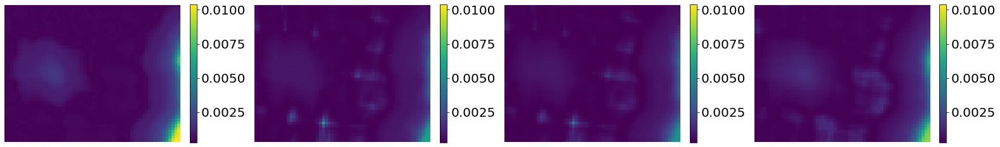

In [50]:
plt.figure(figsize=(26.67,7))
gs = gridspec.GridSpec(1,4, wspace = 0.3)
ax1,ax2,ax3,ax4 = plt.subplot(gs[0]), plt.subplot(gs[1]), plt.subplot(gs[2]), plt.subplot(gs[3])

im1 = ax1.imshow(np.mean(unc10, axis = 2),  origin = 'lower', vmin = cmin, vmax = cmax)
im2 = ax2.imshow(np.mean(unc03, axis = 2),  origin = 'lower', vmin = cmin, vmax = cmax)
im3 = ax3.imshow(np.mean(unc01, axis = 2),  origin = 'lower', vmin = cmin, vmax = cmax)
im4 = ax4.imshow(np.mean(unc001, axis = 2), origin = 'lower', vmin = cmin, vmax = cmax)

cbar1 = plt.colorbar(im1, ax = ax1, fraction = 0.036)
cbar2 = plt.colorbar(im2, ax = ax2, fraction = 0.036)
cbar3 = plt.colorbar(im3, ax = ax3, fraction = 0.036)
cbar4 = plt.colorbar(im4, ax = ax4, fraction = 0.036)

cbar1.ax.tick_params(labelsize = 20)
cbar2.ax.tick_params(labelsize = 20)
cbar3.ax.tick_params(labelsize = 20)
cbar4.ax.tick_params(labelsize = 20)

ax1.axis('off'), ax2.axis('off'), ax3.axis('off'), ax4.axis('off');

* Big fig

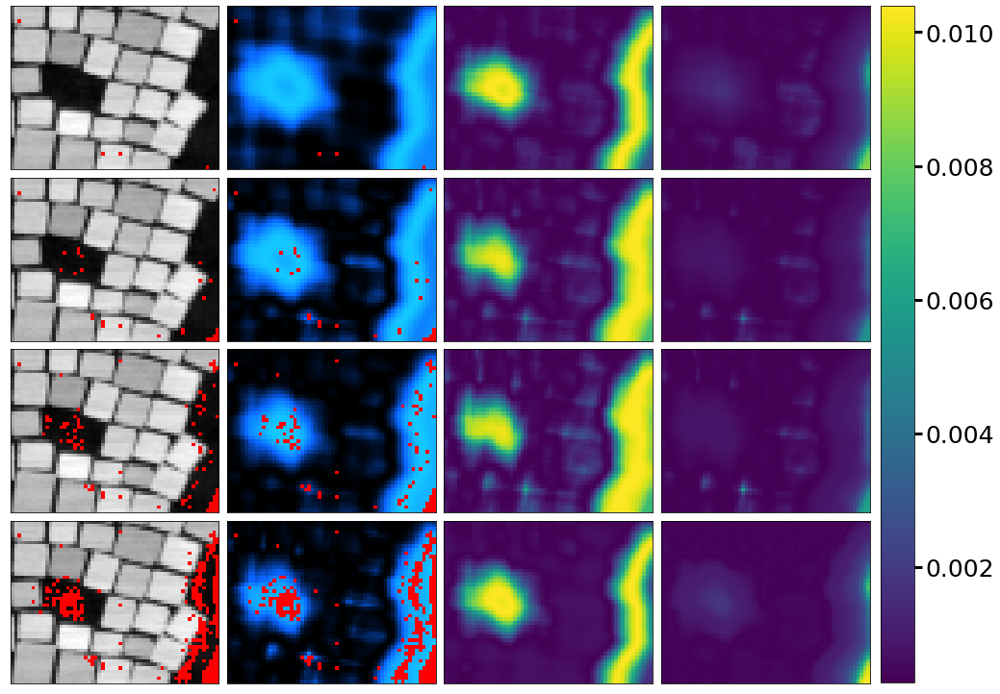

In [128]:
step1, step2, step3, step4 = 2, 27, 84, -1

Predictions = [pred001.mean(2), pred01.mean(2), pred03.mean(2), pred10.mean(2)]
Uncertainties = [unc001.mean(2), unc01.mean(2), unc03.mean(2), unc10.mean(2)]
ADFs = [HAADF_mov[step1], HAADF_mov[step2], HAADF_mov[step3], HAADF_mov[step4]]
AFs = [AF_resized[step1], AF_resized[step2], AF_resized[step3], AF_resized[step4]]
All_imgs = [ADFs, AFs, Predictions,Uncertainties]
###############################################################
fig = plt.figure(figsize=(16,13))
gs = gridspec.GridSpec(4,4, wspace = 0.04, hspace = 0.04)

for ii in range(4):
    ax = fig.add_subplot(gs[ii,0])
    ax.imshow(All_imgs[0][ii], origin = 'lower')
    plt.setp(ax, xticks=[], yticks=[])
for ii in range(4):
    ax = fig.add_subplot(gs[ii,1])
    ax.imshow(All_imgs[1][ii], origin = 'lower')
    plt.setp(ax, xticks=[], yticks=[])
for ii in range(4):
    ax = fig.add_subplot(gs[ii,2])
    ax.imshow(All_imgs[2][ii], origin = 'lower')
    plt.setp(ax, xticks=[], yticks=[])
for ii in range(4):
    ax = fig.add_subplot(gs[ii,3])
    im = ax.imshow(All_imgs[3][ii], origin = 'lower', vmin = cmin, vmax = cmax)
    plt.setp(ax, xticks=[], yticks=[])
    # cbar = plt.colorbar(im, ax=ax, fraction = 0.2, aspect = 5)
    # cbar.ax.tick_params(labelsize = 15)



cbar_ax = fig.add_axes([0.91, 0.127, 0.03, 0.752])
fig.colorbar(im, cax=cbar_ax)
cbar_ax.tick_params(labelsize = 25, width = 3, length = 8)

* Average Spectra combined

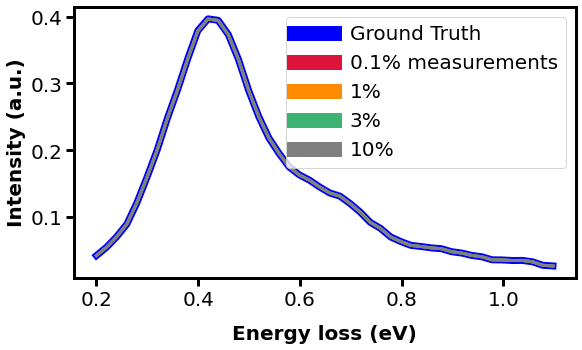

In [357]:
plt.figure(figsize=(9,5))
ax = plt.gca()

ax.plot(e_reduced, y.T.mean(0), c='blue', lw = 7, label = 'Ground Truth')
ax.plot(e_reduced, pred001.mean((0,1)), c='crimson', lw = 2, label = '0.1% measurements')
ax.plot(e_reduced, pred01.mean((0,1)), c='darkorange', lw = 3, label = '1%')
ax.plot(e_reduced, pred03.mean((0,1)), c='mediumseagreen', lw = 3, label = '3%')
ax.plot(e_reduced, pred10.mean((0,1)), c='gray', lw = 3, label = '10%')

leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

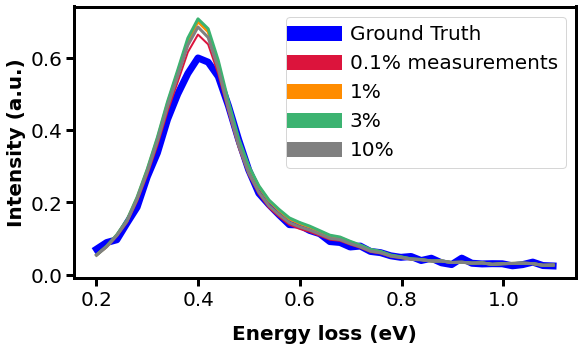

In [351]:
plt.figure(figsize=(9,5))
ax = plt.gca()
i1,j1 = 30, 58    # one where low uncertainty exists,
# i1,j1 = 30, 24    # one where high uncertainty exists
ax.plot(e_reduced, y.T.reshape(pred10.shape)[i1,j1], c='blue', lw = 7, label = 'Ground Truth')
ax.plot(e_reduced, pred001[i1,j1], c='crimson', lw = 2, label = '0.1% measurements')
ax.plot(e_reduced, pred01[i1,j1], c='darkorange', lw = 3, label = '1%')
ax.plot(e_reduced, pred03[i1,j1], c='mediumseagreen', lw = 3, label = '3%')
ax.plot(e_reduced, pred10[i1,j1], c='gray', lw = 3, label = '10%')

leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

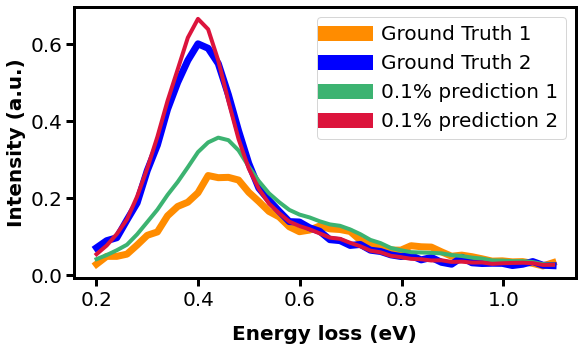

In [352]:
plt.figure(figsize=(9,5))
ax = plt.gca()

i1,j1 = 30, 24    # one where high uncertainty exists
i2,j2 = 30, 58    # one where low uncertainty exists,

ax.plot(e_reduced, y.T.reshape(pred10.shape)[i1,j1], c='darkorange', lw = 7, label = 'Ground Truth 1')
ax.plot(e_reduced, y.T.reshape(pred10.shape)[i2,j2], c='blue', lw = 7, label = 'Ground Truth 2')
ax.plot(e_reduced, pred001[i1,j1], c='mediumseagreen', lw = 4, label = '0.1% prediction 1')
ax.plot(e_reduced, pred001[i2,j2], c='crimson', lw = 4, label = '0.1% prediction 2')

leg=ax.legend(fontsize = 20)
for line in leg.get_lines():
  line.set_linewidth(15)

ax.set_xlabel('Energy loss (eV)', fontsize = 20, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 20, weight = 'bold')
ax.tick_params(labelsize = 20, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(3)

We can also try reconstructing the entire FOV based on the visited points:

In [ ]:
dklgp_1 = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
dklgp_1.fit(X_train, y_train, training_cycles=50)

samples = dklgp_1.sample_from_posterior(X, num_samples=1000)
mean = samples.mean(0).T
var = samples.var(0).T

Epoch 1/50 ... Training loss: 44.132
Epoch 10/50 ... Training loss: 42.3224
Epoch 20/50 ... Training loss: 39.9356
Epoch 30/50 ... Training loss: 37.6976
Epoch 40/50 ... Training loss: 35.3851
Epoch 50/50 ... Training loss: 33.006


In [ ]:
k = 11  # slide across the "energy" axis
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 2))
ax1.scatter(indices[:, 1], indices[:, 0], s=50, marker='s', c=mean[:, k])
ax1.set_title("DKL prediction")
ax2.scatter(indices[:, 1], indices[:, 0], s=50, marker='s', c=var[:, k])
ax2.set_title("DKL uncertainty")
ax3.plot(y.T.mean(0), linewidth=4, label="ground truth (aver)", zorder=0)
ax3.plot(mean.mean(0), linewidth=4, c='red', alpha=0.5, label="prediction (aver)", zorder=1)
ax3.vlines(k, y.T.mean(0).min(), y.T.mean(0).max(), linestyle="--")
ax3.legend()

Note that the average predicted spectra is characeterized by a higher value of plasmonic peak(s). This is not surprising since we were mostly focused on discovering the regions with high plasmonic response.

Now let's combine exploitation with pure exploration. Specifically, after 60 steps we are going to switch from the expected improvement (of the desired functionality) acquisition function to a pure uncertainty-based exploration.

In [ ]:
(X_train, X_test, y_train, y_test,
 indices_train, indices_test) = train_test_split(
     X, y.T, indices, test_size=0.999, shuffle=True, random_state=42)

y_train = y_train.T
y_test = y_test.T

print(X_train.shape) # n_samples x n_features
print(y_train.shape) # vector_size x n_samples 

(2, 256)
(128, 2)


1/80
Epoch 1/20 ... Training loss: 128.15
Epoch 10/20 ... Training loss: 122.6031
Epoch 20/20 ... Training loss: 114.4611


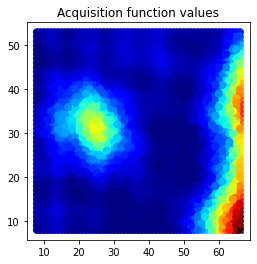

2/80
Epoch 1/20 ... Training loss: 126.2715
Epoch 10/20 ... Training loss: 120.6376
Epoch 20/20 ... Training loss: 113.4867


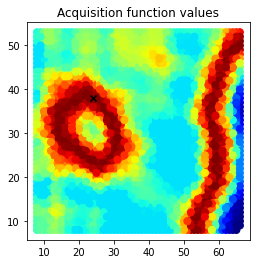

3/80
Epoch 1/20 ... Training loss: 123.3573
Epoch 10/20 ... Training loss: 119.1583
Epoch 20/20 ... Training loss: 111.2841


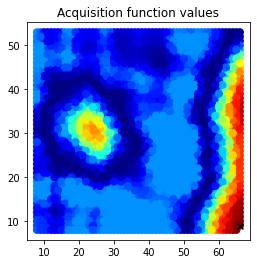

4/80
Epoch 1/20 ... Training loss: 121.029
Epoch 10/20 ... Training loss: 116.5543
Epoch 20/20 ... Training loss: 110.2794


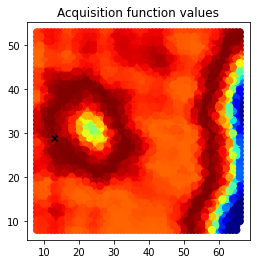

5/80
Epoch 1/20 ... Training loss: 119.0095
Epoch 10/20 ... Training loss: 114.0955
Epoch 20/20 ... Training loss: 108.5334


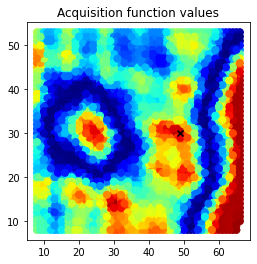

6/80
Epoch 1/20 ... Training loss: 117.4796
Epoch 10/20 ... Training loss: 114.8542
Epoch 20/20 ... Training loss: 107.6173


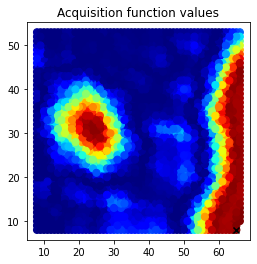

7/80
Epoch 1/20 ... Training loss: 116.0269
Epoch 10/20 ... Training loss: 111.6597
Epoch 20/20 ... Training loss: 105.656


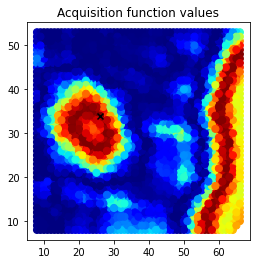

8/80
Epoch 1/20 ... Training loss: 115.3781
Epoch 10/20 ... Training loss: 110.9556
Epoch 20/20 ... Training loss: 104.7454


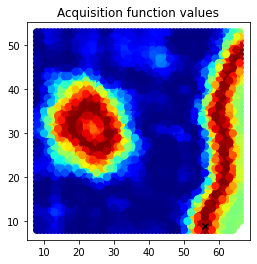

9/80
Epoch 1/20 ... Training loss: 114.4998
Epoch 10/20 ... Training loss: 110.2762
Epoch 20/20 ... Training loss: 104.4339


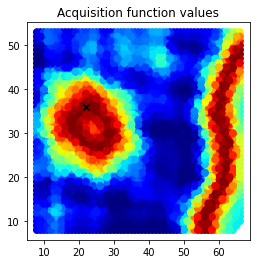

10/80
Epoch 1/20 ... Training loss: 113.4973
Epoch 10/20 ... Training loss: 109.4506
Epoch 20/20 ... Training loss: 102.8773


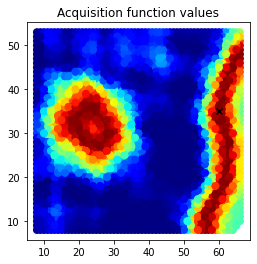

11/80
Epoch 1/20 ... Training loss: 112.5093
Epoch 10/20 ... Training loss: 109.3048
Epoch 20/20 ... Training loss: 102.603


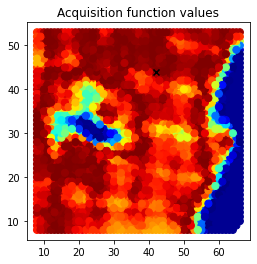

12/80
Epoch 1/20 ... Training loss: 111.8366
Epoch 10/20 ... Training loss: 108.1876
Epoch 20/20 ... Training loss: 102.3338


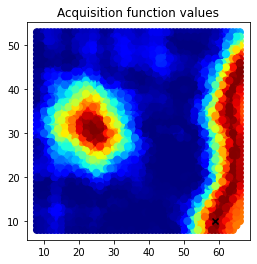

13/80
Epoch 1/20 ... Training loss: 111.1593
Epoch 10/20 ... Training loss: 107.4922
Epoch 20/20 ... Training loss: 101.5966


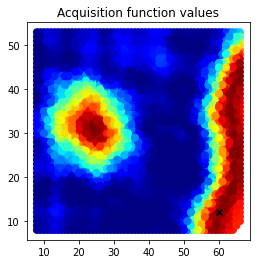

14/80
Epoch 1/20 ... Training loss: 110.6963
Epoch 10/20 ... Training loss: 107.3315
Epoch 20/20 ... Training loss: 100.8919


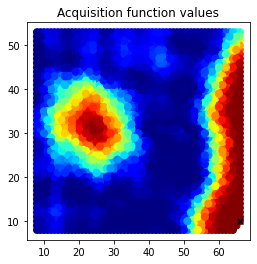

15/80
Epoch 1/20 ... Training loss: 110.1843
Epoch 10/20 ... Training loss: 106.2977
Epoch 20/20 ... Training loss: 99.687


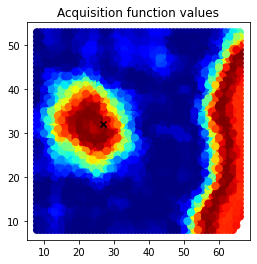

16/80
Epoch 1/20 ... Training loss: 109.6204
Epoch 10/20 ... Training loss: 105.2571
Epoch 20/20 ... Training loss: 99.826


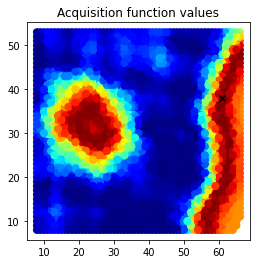

17/80
Epoch 1/20 ... Training loss: 109.2109
Epoch 10/20 ... Training loss: 105.5453
Epoch 20/20 ... Training loss: 99.2268


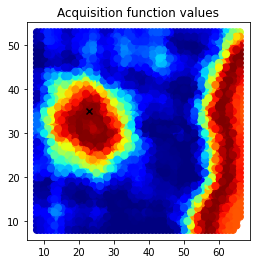

18/80
Epoch 1/20 ... Training loss: 108.7235
Epoch 10/20 ... Training loss: 104.6334
Epoch 20/20 ... Training loss: 98.9828


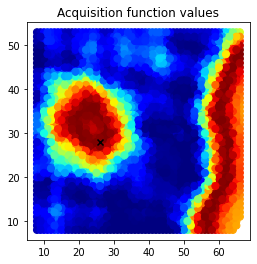

19/80
Epoch 1/20 ... Training loss: 108.4027
Epoch 10/20 ... Training loss: 104.1621
Epoch 20/20 ... Training loss: 98.4516


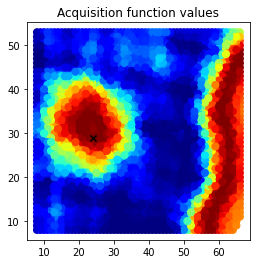

20/80
Epoch 1/20 ... Training loss: 108.0011
Epoch 10/20 ... Training loss: 102.7868
Epoch 20/20 ... Training loss: 97.5671


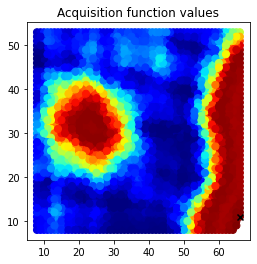

21/80
Epoch 1/20 ... Training loss: 107.6409
Epoch 10/20 ... Training loss: 102.6779
Epoch 20/20 ... Training loss: 96.8829


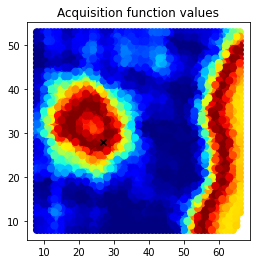

22/80
Epoch 1/20 ... Training loss: 107.4556
Epoch 10/20 ... Training loss: 103.3976
Epoch 20/20 ... Training loss: 97.3585


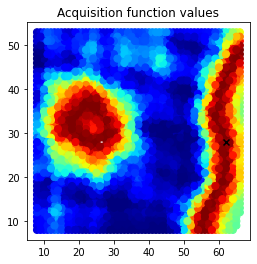

23/80
Epoch 1/20 ... Training loss: 107.0564
Epoch 10/20 ... Training loss: 103.0416
Epoch 20/20 ... Training loss: 96.9674


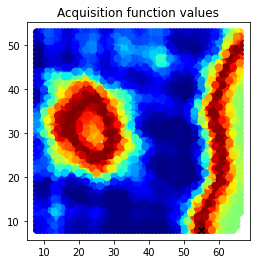

24/80
Epoch 1/20 ... Training loss: 106.6639
Epoch 10/20 ... Training loss: 101.3789
Epoch 20/20 ... Training loss: 95.9566


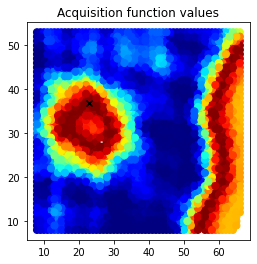

25/80
Epoch 1/20 ... Training loss: 106.377
Epoch 10/20 ... Training loss: 102.1034
Epoch 20/20 ... Training loss: 95.8131


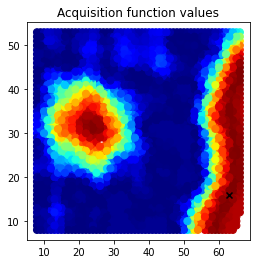

26/80
Epoch 1/20 ... Training loss: 106.1361
Epoch 10/20 ... Training loss: 101.5752
Epoch 20/20 ... Training loss: 96.199


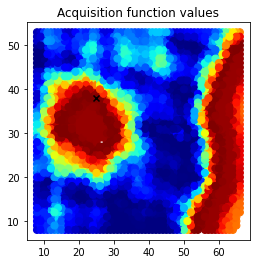

27/80
Epoch 1/20 ... Training loss: 105.8514
Epoch 10/20 ... Training loss: 100.3277
Epoch 20/20 ... Training loss: 95.1664


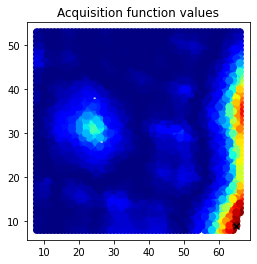

28/80
Epoch 1/20 ... Training loss: 105.6066
Epoch 10/20 ... Training loss: 101.3238
Epoch 20/20 ... Training loss: 95.9599


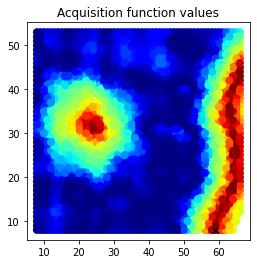

29/80
Epoch 1/20 ... Training loss: 105.3514
Epoch 10/20 ... Training loss: 101.6043
Epoch 20/20 ... Training loss: 95.6433


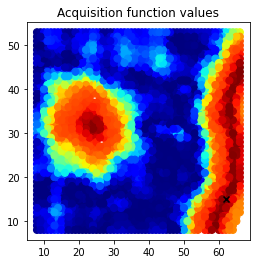

30/80
Epoch 1/20 ... Training loss: 105.1404
Epoch 10/20 ... Training loss: 101.0474
Epoch 20/20 ... Training loss: 95.2196


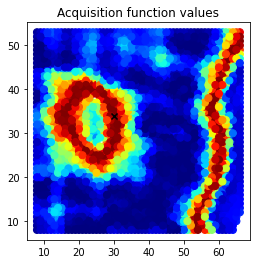

31/80
Epoch 1/20 ... Training loss: 104.9073
Epoch 10/20 ... Training loss: 100.8745
Epoch 20/20 ... Training loss: 94.9448


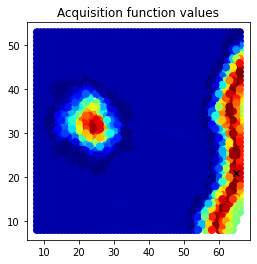

32/80
Epoch 1/20 ... Training loss: 104.7484
Epoch 10/20 ... Training loss: 101.2727
Epoch 20/20 ... Training loss: 95.0225


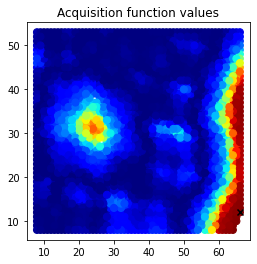

33/80
Epoch 1/20 ... Training loss: 104.545
Epoch 10/20 ... Training loss: 99.9464
Epoch 20/20 ... Training loss: 94.8303


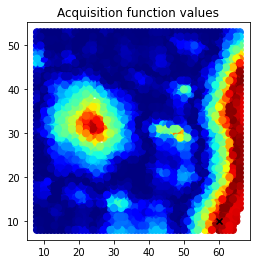

34/80
Epoch 1/20 ... Training loss: 104.3551
Epoch 10/20 ... Training loss: 99.3685
Epoch 20/20 ... Training loss: 94.6487


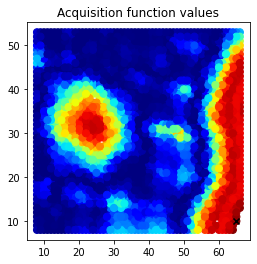

35/80
Epoch 1/20 ... Training loss: 104.1687
Epoch 10/20 ... Training loss: 99.4403
Epoch 20/20 ... Training loss: 94.229


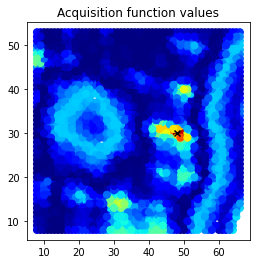

36/80
Epoch 1/20 ... Training loss: 104.181
Epoch 10/20 ... Training loss: 100.1979
Epoch 20/20 ... Training loss: 94.6753


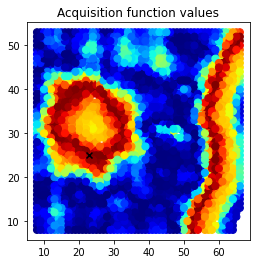

37/80
Epoch 1/20 ... Training loss: 104.0757
Epoch 10/20 ... Training loss: 100.0013
Epoch 20/20 ... Training loss: 94.0815


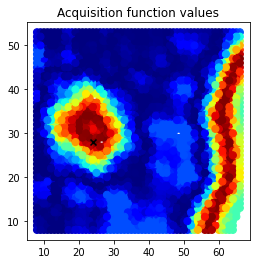

38/80
Epoch 1/20 ... Training loss: 103.9674
Epoch 10/20 ... Training loss: 99.9269
Epoch 20/20 ... Training loss: 94.28


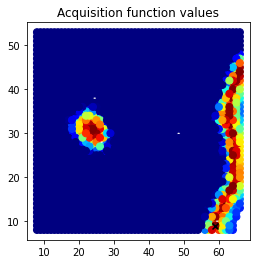

39/80
Epoch 1/20 ... Training loss: 103.7954
Epoch 10/20 ... Training loss: 99.5568
Epoch 20/20 ... Training loss: 94.2081


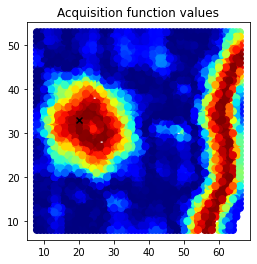

40/80
Epoch 1/20 ... Training loss: 103.6432
Epoch 10/20 ... Training loss: 99.1904
Epoch 20/20 ... Training loss: 94.0913


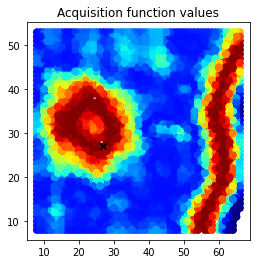

41/80
Epoch 1/20 ... Training loss: 103.6169
Epoch 10/20 ... Training loss: 99.2417
Epoch 20/20 ... Training loss: 93.6147


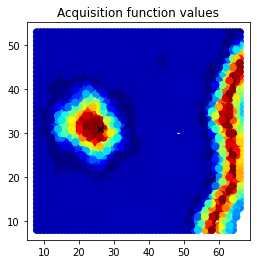

42/80
Epoch 1/20 ... Training loss: 103.4528
Epoch 10/20 ... Training loss: 99.1395
Epoch 20/20 ... Training loss: 93.6259


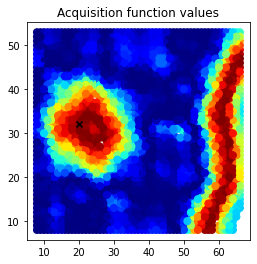

43/80
Epoch 1/20 ... Training loss: 103.3105
Epoch 10/20 ... Training loss: 98.488
Epoch 20/20 ... Training loss: 93.4876


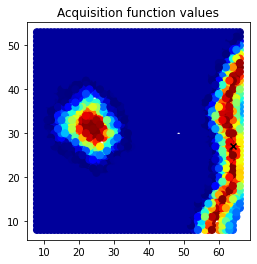

44/80
Epoch 1/20 ... Training loss: 103.2087
Epoch 10/20 ... Training loss: 98.6642
Epoch 20/20 ... Training loss: 93.5747


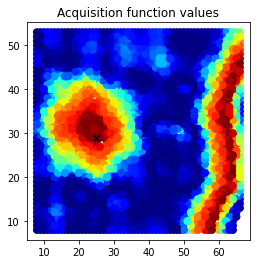

45/80
Epoch 1/20 ... Training loss: 103.0771
Epoch 10/20 ... Training loss: 98.2848
Epoch 20/20 ... Training loss: 93.3858


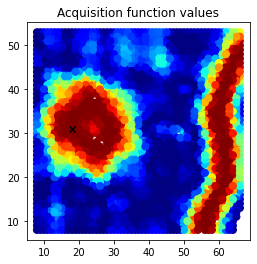

46/80
Epoch 1/20 ... Training loss: 102.9449
Epoch 10/20 ... Training loss: 98.3212
Epoch 20/20 ... Training loss: 93.2872


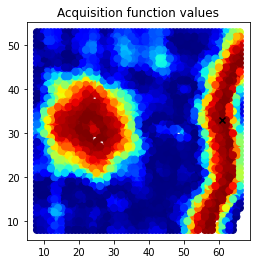

47/80
Epoch 1/20 ... Training loss: 102.8037
Epoch 10/20 ... Training loss: 98.3601
Epoch 20/20 ... Training loss: 92.7466


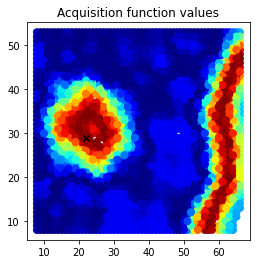

48/80
Epoch 1/20 ... Training loss: 102.8208
Epoch 10/20 ... Training loss: 98.3057
Epoch 20/20 ... Training loss: 92.9179


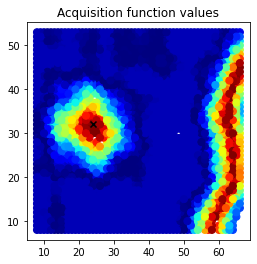

49/80
Epoch 1/20 ... Training loss: 102.7133
Epoch 10/20 ... Training loss: 98.1765
Epoch 20/20 ... Training loss: 92.7519


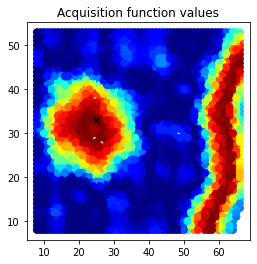

50/80
Epoch 1/20 ... Training loss: 102.625
Epoch 10/20 ... Training loss: 97.8465
Epoch 20/20 ... Training loss: 92.4159


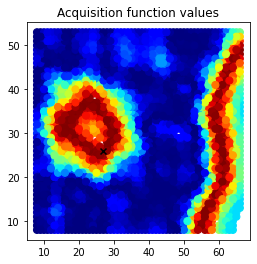

51/80
Epoch 1/20 ... Training loss: 102.6066
Epoch 10/20 ... Training loss: 97.8081
Epoch 20/20 ... Training loss: 92.7301


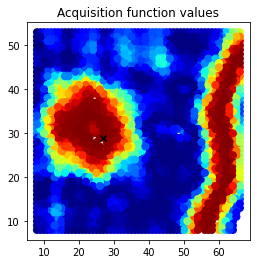

52/80
Epoch 1/20 ... Training loss: 102.4904
Epoch 10/20 ... Training loss: 97.9507
Epoch 20/20 ... Training loss: 92.6281


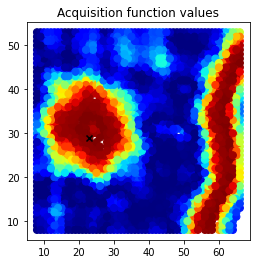

53/80
Epoch 1/20 ... Training loss: 102.4172
Epoch 10/20 ... Training loss: 97.8464
Epoch 20/20 ... Training loss: 92.4073


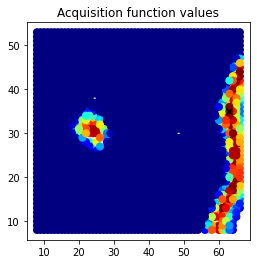

54/80
Epoch 1/20 ... Training loss: 102.2986
Epoch 10/20 ... Training loss: 97.7833
Epoch 20/20 ... Training loss: 92.4164


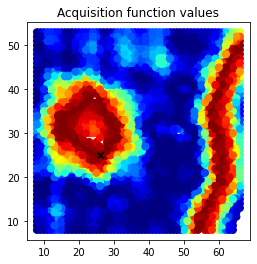

55/80
Epoch 1/20 ... Training loss: 102.2892
Epoch 10/20 ... Training loss: 97.6406
Epoch 20/20 ... Training loss: 92.3507


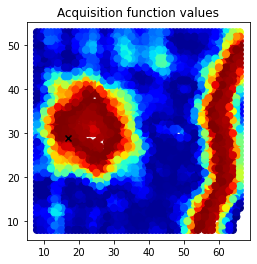

56/80
Epoch 1/20 ... Training loss: 102.209
Epoch 10/20 ... Training loss: 96.8467
Epoch 20/20 ... Training loss: 91.7484


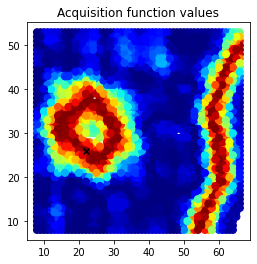

57/80
Epoch 1/20 ... Training loss: 102.147
Epoch 10/20 ... Training loss: 97.0946
Epoch 20/20 ... Training loss: 92.1998


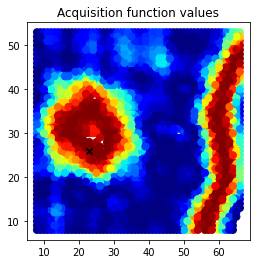

58/80
Epoch 1/20 ... Training loss: 102.0941
Epoch 10/20 ... Training loss: 97.3159
Epoch 20/20 ... Training loss: 91.9069


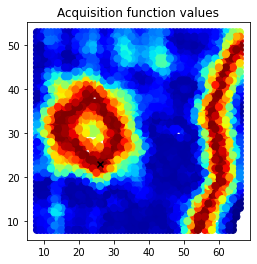

59/80
Epoch 1/20 ... Training loss: 102.0121
Epoch 10/20 ... Training loss: 97.2004
Epoch 20/20 ... Training loss: 92.0018


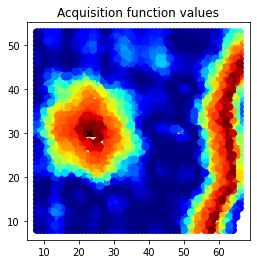

60/80
Epoch 1/20 ... Training loss: 101.9239
Epoch 10/20 ... Training loss: 96.9982
Epoch 20/20 ... Training loss: 91.9254


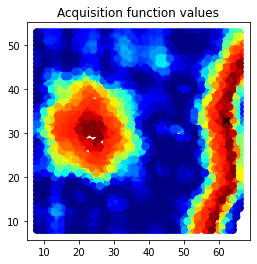

61/80
Epoch 1/20 ... Training loss: 101.8247
Epoch 10/20 ... Training loss: 97.0266
Epoch 20/20 ... Training loss: 91.6442


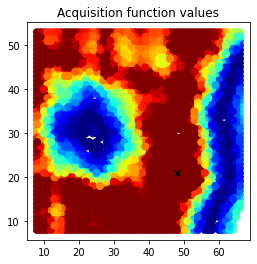

62/80
Epoch 1/20 ... Training loss: 101.7842
Epoch 10/20 ... Training loss: 97.4977
Epoch 20/20 ... Training loss: 91.8743


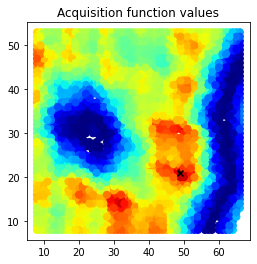

63/80
Epoch 1/20 ... Training loss: 101.7568
Epoch 10/20 ... Training loss: 97.1701
Epoch 20/20 ... Training loss: 91.9004


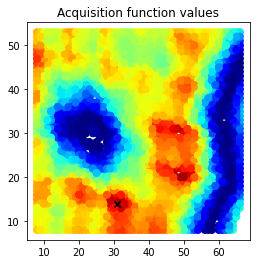

64/80
Epoch 1/20 ... Training loss: 101.6866
Epoch 10/20 ... Training loss: 96.7932
Epoch 20/20 ... Training loss: 91.6903


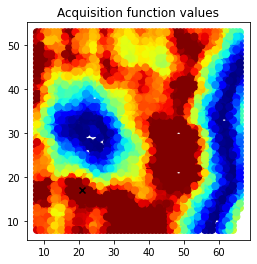

65/80
Epoch 1/20 ... Training loss: 101.6399
Epoch 10/20 ... Training loss: 97.017
Epoch 20/20 ... Training loss: 91.8446


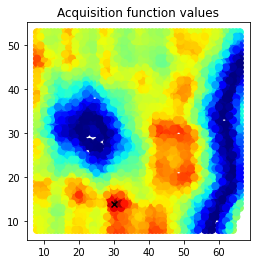

66/80
Epoch 1/20 ... Training loss: 101.5729
Epoch 10/20 ... Training loss: 96.7945
Epoch 20/20 ... Training loss: 91.7197


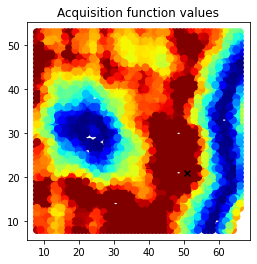

67/80
Epoch 1/20 ... Training loss: 101.4976
Epoch 10/20 ... Training loss: 96.681
Epoch 20/20 ... Training loss: 91.9077


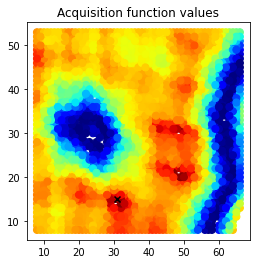

68/80
Epoch 1/20 ... Training loss: 101.4399
Epoch 10/20 ... Training loss: 97.0673
Epoch 20/20 ... Training loss: 91.6065


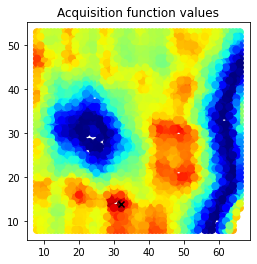

69/80
Epoch 1/20 ... Training loss: 101.3806
Epoch 10/20 ... Training loss: 96.9629
Epoch 20/20 ... Training loss: 91.2989


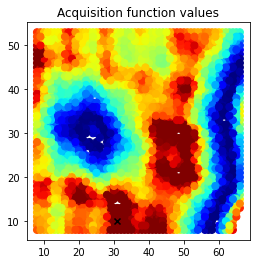

70/80
Epoch 1/20 ... Training loss: 101.3395
Epoch 10/20 ... Training loss: 97.157
Epoch 20/20 ... Training loss: 91.8048


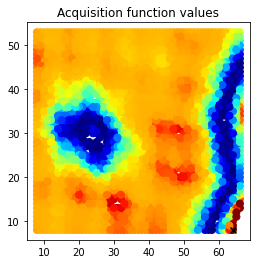

71/80
Epoch 1/20 ... Training loss: 101.2749
Epoch 10/20 ... Training loss: 96.6574
Epoch 20/20 ... Training loss: 91.2127


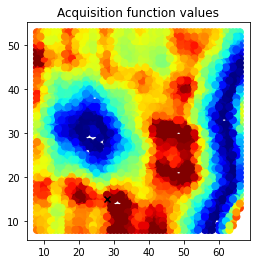

72/80
Epoch 1/20 ... Training loss: 101.2256
Epoch 10/20 ... Training loss: 96.397
Epoch 20/20 ... Training loss: 91.741


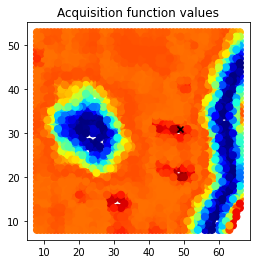

73/80
Epoch 1/20 ... Training loss: 101.1834
Epoch 10/20 ... Training loss: 96.3886
Epoch 20/20 ... Training loss: 91.7515


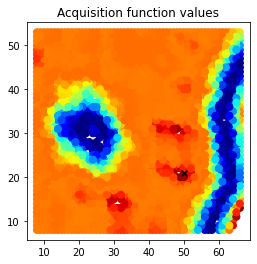

74/80
Epoch 1/20 ... Training loss: 101.1298
Epoch 10/20 ... Training loss: 96.1834
Epoch 20/20 ... Training loss: 91.7113


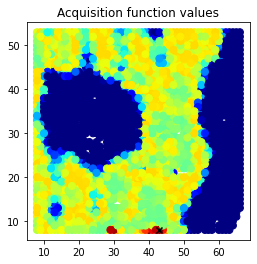

75/80
Epoch 1/20 ... Training loss: 101.0761
Epoch 10/20 ... Training loss: 96.1716
Epoch 20/20 ... Training loss: 91.4494


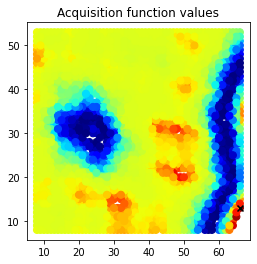

76/80
Epoch 1/20 ... Training loss: 101.0161
Epoch 10/20 ... Training loss: 96.8955
Epoch 20/20 ... Training loss: 91.6465


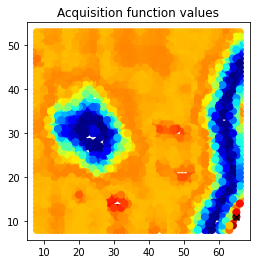

77/80
Epoch 1/20 ... Training loss: 100.9584
Epoch 10/20 ... Training loss: 96.77
Epoch 20/20 ... Training loss: 91.1571


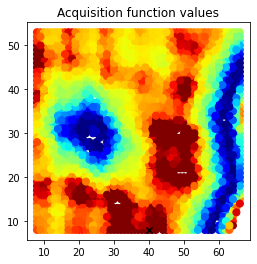

78/80
Epoch 1/20 ... Training loss: 100.9131
Epoch 10/20 ... Training loss: 96.6413
Epoch 20/20 ... Training loss: 91.1268


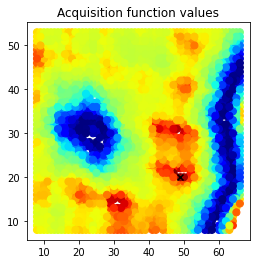

79/80
Epoch 1/20 ... Training loss: 100.8756
Epoch 10/20 ... Training loss: 96.4055
Epoch 20/20 ... Training loss: 91.4959


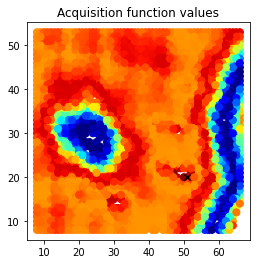

80/80
Epoch 1/20 ... Training loss: 100.8162
Epoch 10/20 ... Training loss: 96.0356
Epoch 20/20 ... Training loss: 91.4554


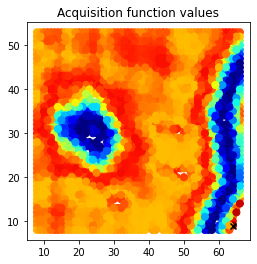

In [ ]:
band = [30, 35]

data_dim = X_train.shape[-1]


xi = 0.01  # balances exploration and exploitation for EI
exploration_steps = 80

for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    training_iter = 20 if e < 100 else 40  # we do not want to "overfit" our model at the beginning
    # update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="double")
    dklgp.fit(X_train, y_train, training_cycles=training_iter)
    # Compute the acquisition function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max())
    obj = EI(dklgp, X_test, best_f, xi) if e < 60 else CE(dklgp, X_test) # switch to a different acquisition function after 60 steps
    obj = obj.T # transpose to n_samples x vector_size  for consistency
    # Scalarize the acqusition function
    obj = scalarize_acq(obj)
    # Select next point to "measure"
    next_point_idx = obj.argmax()
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[:, next_point_idx]
    # Plot current result
    plot_result(indices_test, obj, e)
    # Append to the arrays of measured points
    X_train = np.append(X_train, X_test[next_point_idx][None], 0)
    X_test = np.delete(X_test, next_point_idx, 0)
    y_train = np.append(y_train, measured_point[:, None], 1)
    y_test = np.delete(y_test, next_point_idx, 1)
    indices_train = np.append(indices_train, next_point[None], 0)
    indices_test = np.delete(indices_test, next_point_idx, 0)

Plot the visited points:

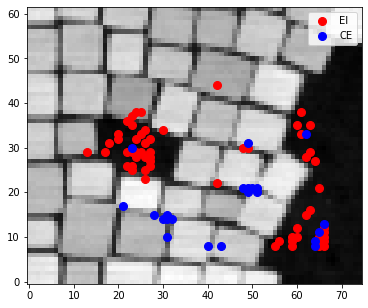

In [ ]:
plt.figure(figsize=(6, 6))
plt.imshow(full_img, cmap='gray', origin="lower")
plt.scatter(indices_train[:60, 1], indices_train[:60, 0], s=64, c='r', label="EI")
plt.scatter(indices_train[60:, 1], indices_train[60:, 0], s=64, c='b', label="CE")
plt.legend()

# Non-negative matrix factorization

In [143]:
from sklearn.decomposition import PCA, NMF
from matplotlib.colors import LinearSegmentedColormap

Purple=130./255,53/255., 1.
Orange=1,120./255, 0
Blue=10./255,175/255., 1.
Red=200./255,20/255., 20/225.
Green=50./255,220./255, 50./255
Yellow=220./255,220./255, 90./255
Pink=255/255.,105/255., 180/255.
Gold=155/255.,205/255.,32/255.
Turquoise=72/255., 229/255., 204/255.
Brown=220/255., 142/255., 105/255.
Forest=64/255., 169/255., 64/255.
Gray=159/255., 176/255., 184/255.
Royal=95/255., 55/255., 255/255.

Cmap_Purple = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Purple),(1,1,1)], N=100)
Cmap_Orange = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Orange),(1,1,1)], N=100)
Cmap_Blue = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Blue),(1,1,1)], N=100)
Cmap_Red = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Red),(1,1,1)], N=100)
Cmap_Green = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Green),(1,1,1)], N=100)
Cmap_Pink = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Pink),(1,1,1)], N=100)
Cmap_Gold = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gold),(1,1,1)], N=100)
Cmap_Gray = LinearSegmentedColormap.from_list('list', [(0, 0, 0), (Gray),(1,1,1)], N=100)

colorlist = [Purple, Green, Blue, Red, Orange, Pink, Gold, Gray]
cmaplist = [Cmap_Purple, Cmap_Green, Cmap_Blue, Cmap_Red, Cmap_Orange, Cmap_Pink, Cmap_Gold, Cmap_Gray]

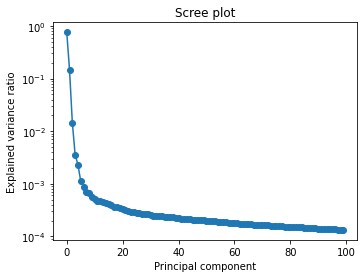

In [141]:
SINBflat = np.reshape(specim, (specim.shape[0]*specim.shape[1],specim.shape[2]))
fig= plt.figure(figsize=(12,4))
gs = gridspec.GridSpec(1,2)
ax1 = plt.subplot(gs[0,0])

pca = PCA()

pca.fit(SINBflat[:,:])

explained_var = pca.explained_variance_ratio_

ax1.plot(explained_var[0:100], 'o-')
ax1.semilogy()
ax1.set_xlabel('Principal component')
ax1.set_ylabel('Explained variance ratio');
ax1.set_title('Scree plot')


SIdecon=np.copy(SINBflat)
SIdecon=np.copy(SINBflat[:,:])
SIdecon[np.where(SIdecon<0)]=0

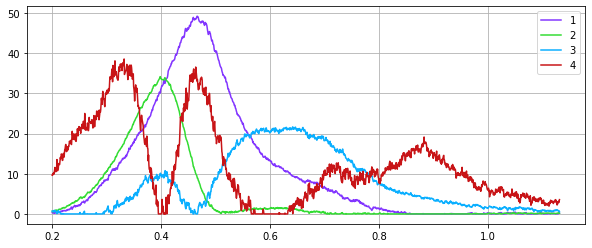

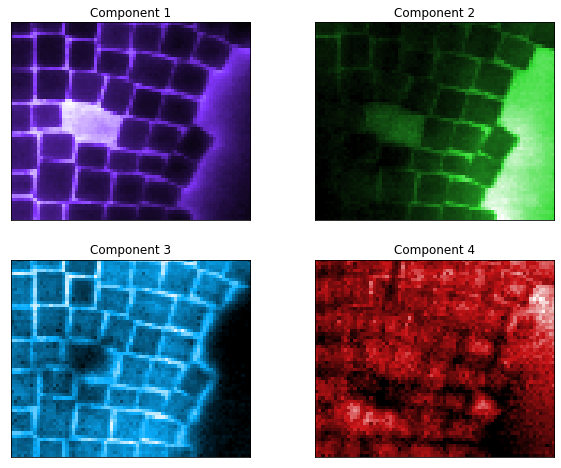

In [146]:
N=4

XY = specim.shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm=model.fit_transform(SIdecon[:,:])
NMFSpec=model.components_
NMFIm=NMFIm.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(e_ax,NMFSpec[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(e_ax,NMFSpec[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm[jj],cmap = cmaplist[jj], origin = 'lower')
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm[jj],cmap = cmaplist[int(jj - len(colorlist)*rollover)], origin = 'lower')
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

* This seems to give better results if using a higher (than expected) number of components

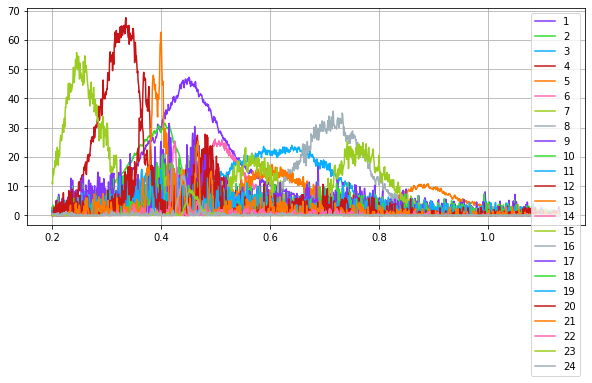

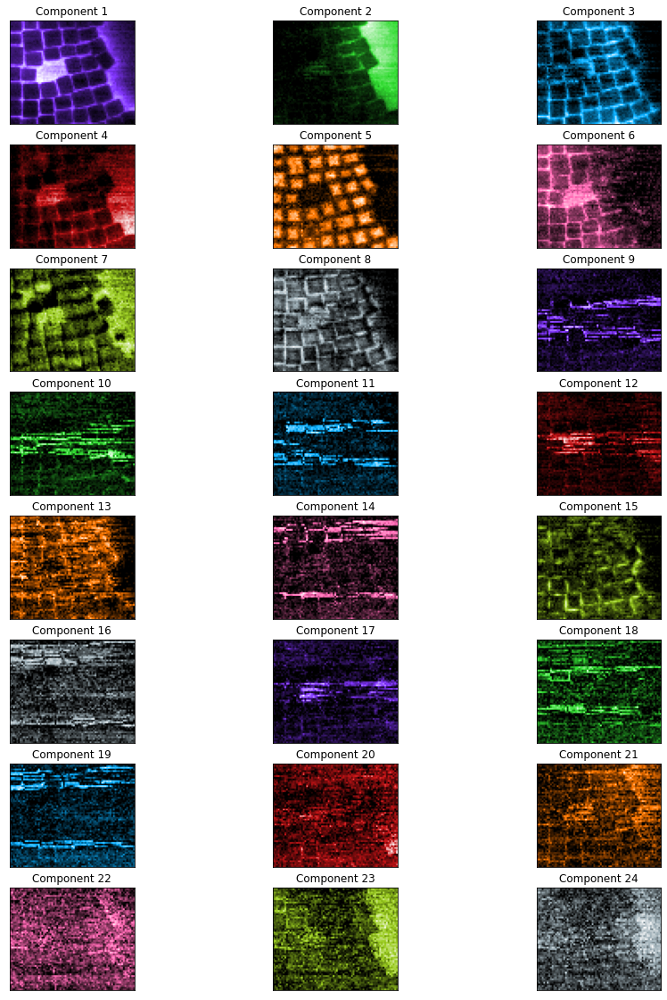

In [149]:
N=24

XY = specim.shape[0:2]
model=NMF(n_components=N, random_state = 42)
NMFIm=model.fit_transform(SIdecon[:,:])
NMFSpec=model.components_
NMFIm=NMFIm.reshape(XY+(N,)).transpose(2,0,1)

rows = int(np.ceil(float(N)/3))
cols = int(np.ceil(float(N)/rows))

fig1,ax1 = plt.subplots(figsize = (10,4))

for jj in range(N):
    try:
      ax1.plot(e_ax,NMFSpec[jj],color = colorlist[jj], label = jj+1)
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax1.plot(e_ax,NMFSpec[jj],color = colorlist[int(jj - len(colorlist)*rollover)], label = jj+1)

    ax1.grid(True)
    ax1.tick_params(labelsize=10)
    ax1.legend()
plt.show()

gs2 = gridspec.GridSpec(rows, cols)
fig2 = plt.figure(figsize = (5*cols, 4*(1+rows//2)))

for jj in range(N):
    ax2 = fig2.add_subplot(gs2[jj])
    try:
      ax2.imshow(NMFIm[jj],cmap = cmaplist[jj])
    except IndexError:
      rollover = int(jj/len(colorlist))
      ax2.imshow(NMFIm[jj],cmap = cmaplist[int(jj - len(colorlist)*rollover)])
    ax2.set_title('Component ' + str(jj+1))
    plt.setp([ax2],xticks=[], yticks=[])

* Then select the reasonable ones (yes there is some bias / required domain expertise)

In [150]:
comps = [0,1,2,4]
len(comps)

4

(0.2, 1.2)

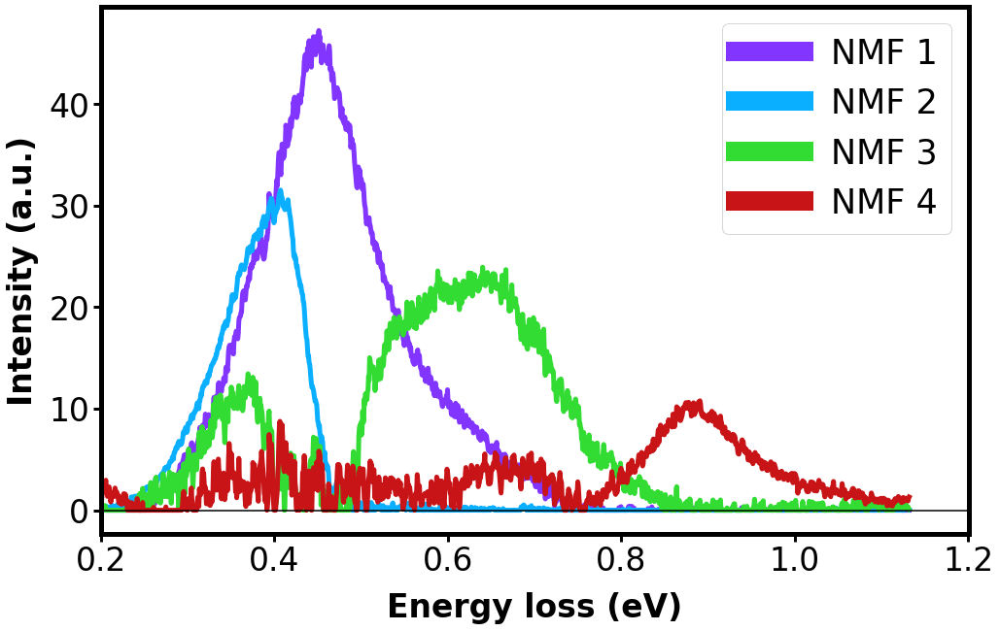

In [155]:
xlimits = [0.2, 1.2]

fig,ax = plt.subplots(1,figsize=(16,10))

fsize = 40

ax.plot(e_ax, NMFSpec[comps[0]], lw = 5, color = colorlist[0], label = 'NMF 1')
ax.plot(e_ax, NMFSpec[comps[1]], lw = 5, color = colorlist[2], label = 'NMF 2')
ax.plot(e_ax, NMFSpec[comps[2]], lw = 5, color = colorlist[1], label = 'NMF 3')
ax.plot(e_ax, NMFSpec[comps[3]], lw = 5, color = colorlist[3], label = 'NMF 4')

leg=ax.legend(fontsize = 35)
for line in leg.get_lines():
  line.set_linewidth(20)

ax.set_xlabel('Energy loss (eV)', fontsize = 33, labelpad = 15, weight = 'bold')
ax.set_ylabel('Intensity (a.u.)', fontsize = 33, labelpad = 10, weight = 'bold')
ax.tick_params(labelsize = 33, length = 8, width = 3)


for axis in ['top','bottom','left','right']:
  ax.spines[axis].set_linewidth(5)

ax.axhline(0, c='k')

ax.set_xlim(xlimits[0], xlimits[1])

[]

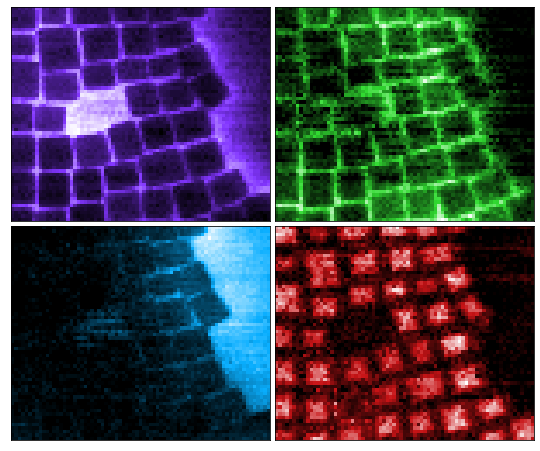

In [154]:
fig = plt.figure(figsize=(9.37,8))
gs = gridspec.GridSpec(2,2, wspace = 0.02, hspace = 0.02)

ax20, ax21  = plt.subplot(gs[0,0]), plt.subplot(gs[1,0]),
ax30, ax31 = plt.subplot(gs[0,1]), plt.subplot(gs[1,1])

fsize = 20
ax20.imshow(NMFIm[comps[0]], cmap = cmaplist[0])
ax21.imshow(NMFIm[comps[1]], cmap = cmaplist[2])
ax30.imshow(NMFIm[comps[2]], cmap = cmaplist[1])
ax31.imshow(NMFIm[comps[3]], cmap = cmaplist[3])

img_axes = [ax20, ax21, ax30, ax31]
plt.setp(img_axes, xticks = [], yticks = [])